# FLIGHT PRICE PREDICTION

## Problem Statement:

Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travellers saying that flight ticket prices are so unpredictable. Here you will be provided with prices of flight tickets for various airlines between the months of March and June of 2019 and between various cities.

# New Section

FEATURES:

Airline: The name of the airline.

Date_of_Journey: The date of the journey

Source: The source from which the service begins.

Destination: The destination where the service ends.

Route: The route taken by the flight to reach the destination.

Dep_Time: The time when the journey starts from the source.

Arrival_Time: Time of arrival at the destination.

Duration: Total duration of the flight.

Total_Stops: Total stops between the source and destination.

Additional_Info: Additional information about the flight

Price: The price of the ticket

## Prediction

We are going to predict now  the price of the flight ticket. 

 

In [1]:
#import all libaries
import pandas as pd
import statistics
import seaborn as sns
from matplotlib import pyplot as plt
import sklearn
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
import warnings
warnings.filterwarnings('ignore')


In [3]:
#stroing into csv file

df = pd.read_excel(r"C:\Users\Srividya\Downloads\Flight_Ticket_Participant_Datasets-20190305T100527Z-001 (4)\Flight_Ticket_Participant_Datasets\Data_train.xlsx")


In [4]:
pd.set_option('display.max_columns', None)

In [5]:
df.to_csv("Flight_Price_Prediction.csv",sep='\t')

In [6]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


Here Source, Destination,Total_Stops are all the columns which has categorical nominal data type.And Airline, Date_of_Journey, Route,Dep_Time, Arrival_Time, Duration,Additional_Info are the columns which has  categorical ordinal data type.

Our Target column is Price which has continous numeric data type.Hence it is a Regression problem.


In [7]:
df.shape

(10683, 11)

This dataset has 10683 rows and 11 columns

In [8]:
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

gives feature names

# Exploratory Data Analysis(EDA):

In [9]:
#checks nulls values of columns if present any
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

There are no null values present

In [11]:
df.info()#checks data type information of the column values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


All independent variables are object data type and the target column is the integer data type

In [13]:
df.apply(lambda x: len(x.unique())) # getting unique values of all the columns

Airline              12
Date_of_Journey      44
Source                5
Destination           6
Route               129
Dep_Time            222
Arrival_Time       1343
Duration            368
Total_Stops           6
Additional_Info      10
Price              1870
dtype: int64

In [14]:
df['Additional_Info'].value_counts()

No info                         8345
In-flight meal not included     1982
No check-in baggage included     320
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
Red-eye flight                     1
1 Short layover                    1
2 Long layover                     1
Name: Additional_Info, dtype: int64

Here in this column nearly 80% of the data  are having no information that means it is having 80% null values.So we can drop this column

In [15]:
df.drop('Additional_Info',inplace=True,axis=1)

In [16]:
# replace empty values of the columns by mean,most frequent values
import numpy as np
from sklearn.impute import SimpleImputer
for col in ['Total_Stops','Route']:
    imp=SimpleImputer(missing_values=np.NaN,strategy="most_frequent")
    df[col]=imp.fit_transform(df[col].values.reshape(-1,1))

In [17]:
df['Destination'].unique()

array(['New Delhi', 'Banglore', 'Cochin', 'Kolkata', 'Delhi', 'Hyderabad'],
      dtype=object)

In [18]:
#As we can see that there are two 'Delhi' values in column we combine them
df['Destination']=df['Destination'].str.replace('New Delhi','Delhi')

In [19]:
#checks nulls values of columns if present any
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Price              0
dtype: int64

In [20]:
import calendar
  
df['Date_of_Journey'] = pd.to_datetime(df['Date_of_Journey'], errors = 'coerce')

# extracting year and month from date
df['month'] = df['Date_of_Journey'].dt.month
df['month']=df['month'].apply(lambda x: calendar.month_abbr[x])




In [21]:
df['year'] = pd.DatetimeIndex(df['Date_of_Journey']).year

In [22]:
df['Route'].value_counts()

DEL → BOM → COK          2377
BLR → DEL                1552
CCU → BOM → BLR           979
CCU → BLR                 724
BOM → HYD                 621
                         ... 
BOM → GOI → HYD             1
BOM → JAI → DEL → HYD       1
CCU → VTZ → BLR             1
BLR → BOM → IXC → DEL       1
BOM → CCU → HYD             1
Name: Route, Length: 128, dtype: int64

the most used route is delhi to bombay to cochin

In [23]:
df['Arrival_Time']=df['Arrival_Time'].str.split(' ').str[0]

strip offf the spaces in arrival time values

In [24]:
df1=df.copy()

In [25]:
df['year'].unique()

array([2019], dtype=int64)

Getting unique values for the year column

In [26]:
arrival_time=df['Arrival_Time']
df['Arrival_hour']=pd.to_datetime(arrival_time).dt.hour
df['Arrival_minute']=pd.to_datetime(arrival_time).dt.minute

In [27]:
df.drop('Arrival_Time',axis=1,inplace=True)

converted to seperate arrival  hours and minute column and dropped the original one

In [28]:
Depart_time=df['Dep_Time']
df['Departure_hour']=pd.to_datetime(Depart_time).dt.hour
df['Departure_minute']=pd.to_datetime(Depart_time).dt.minute

In [29]:
df.drop('Dep_Time',axis=1,inplace=True)

converted to seperate Departure  hours and minute column and dropped the original one

In [30]:
# Time taken by plane to reach destination is called Duration
# It is the differnce betwwen Departure Time and Arrival time
# Assigning and converting Duration column into list
duration = list(df["Duration"])

for i in range(len(duration)):
    if len(duration[i].split()) != 2:    # Check if duration contains only hour or mins
        if "h" in duration[i]:
            duration[i] = duration[i].strip() + " 0m"   # Adds 0 minute
        else:
            duration[i] = "0h " + duration[i]           # Adds 0 hour

duration_hours = []
duration_mins = []
for i in range(len(duration)):
    duration_hours.append(int(duration[i].split(sep = "h")[0]))    # Extract hours from duration
    duration_mins.append(int(duration[i].split(sep = "m")[0].split()[-1]))   # Extracts only minutes from duration

In [31]:
# Adding duration_hours and duration_mins list to train_data dataframe
df["Duration_hours"] = duration_hours
df["Duration_mins"] = duration_mins

In [32]:
df.drop(["Duration"], axis = 1, inplace = True)

converted to seperate Duration hours and minute column and dropped the original one

In [33]:
df['Arrival_hour'] = df['Arrival_hour'] * 60

In [34]:
df['Arrival_time_n_minutes']=df['Arrival_hour']+df['Arrival_minute']

In [35]:
df.drop(['Arrival_hour','Arrival_minute'], axis = 1, inplace = True)

converted to  Arrival_time_n_minutes column and dropped the previous one

In [36]:
df['Departure_hour'] = df['Departure_hour'] * 60

In [37]:
df['Departure_time_n_minutes']=df['Departure_hour']+df['Departure_minute']

In [38]:
df.drop(['Departure_hour','Departure_minute'], axis = 1, inplace = True)

converted to Departure_time_n_minutes column and dropped the previous one

In [39]:
df['Duration_hours'] = df['Duration_hours'] * 60

In [40]:
df['Duration_time_n_minutes']=df['Duration_hours']+df['Duration_mins']

In [41]:
df.drop(['Duration_hours','Duration_mins'], axis = 1, inplace = True)

converted to Duration_time_n_minutes column and dropped the previous one

In [42]:
# separate journey day and month from journey_date
df['day'] = pd.to_datetime(df.Date_of_Journey, format='%d/%m/%Y').dt.day
df['Month'] = pd.to_datetime(df.Date_of_Journey, format='%d/%m/%Y').dt.month


In [43]:
df['Total_Stops'].value_counts()

1 stop      5626
non-stop    3491
2 stops     1520
3 stops       45
4 stops        1
Name: Total_Stops, dtype: int64

one stop happend is more 

In [44]:
# replace the values of total steps
df.replace({"non-stop": 0, "1 stop": 1, "2 stops": 2, "3 stops": 3, "4 stops": 4}, inplace = True)

In [45]:
df['Route1']=df['Route'].str.split('→').str[0]
df['Route2']=df['Route'].str.split('→').str[1]
df['Route3']=df['Route'].str.split('→').str[2]
df['Route4']=df['Route'].str.split('→').str[3]
df['Route5']=df['Route'].str.split('→').str[4]

converted to seperate routes

In [46]:
df.drop(["Route"], axis = 1, inplace = True)

In [47]:
df.isnull().sum()

Airline                         0
Date_of_Journey                 0
Source                          0
Destination                     0
Total_Stops                     0
Price                           0
month                           0
year                            0
Arrival_time_n_minutes          0
Departure_time_n_minutes        0
Duration_time_n_minutes         0
day                             0
Month                           0
Route1                          0
Route2                          0
Route3                       3491
Route4                       9117
Route5                      10637
dtype: int64

In [48]:
for i in ['Route3', 'Route4', 'Route5']:
    df[i].fillna('None',inplace=True)

fills with none value if route is not present

In [49]:
for i in df.columns:
    print('{} has total {} categories'.format(i,len(df[i].value_counts())))

Airline has total 12 categories
Date_of_Journey has total 40 categories
Source has total 5 categories
Destination has total 5 categories
Total_Stops has total 5 categories
Price has total 1870 categories
month has total 7 categories
year has total 1 categories
Arrival_time_n_minutes has total 223 categories
Departure_time_n_minutes has total 222 categories
Duration_time_n_minutes has total 368 categories
day has total 9 categories
Month has total 7 categories
Route1 has total 5 categories
Route2 has total 45 categories
Route3 has total 30 categories
Route4 has total 14 categories
Route5 has total 6 categories


In [50]:
df.groupby(['Airline'])['Price'].agg({'mean','sum','count'})

,sum,count,mean
Airline,,,
Air Asia,1783293,319,5590.260188
Air India,16838841,1752,9611.210616
GoAir,1137045,194,5861.056701
IndiGo,11648071,2053,5673.682903
Jet Airways,44817461,3849,11643.923357
Jet Airways Business,350152,6,58358.666667
Multiple carriers,13039603,1196,10902.678094
Multiple carriers Premium economy,148445,13,11418.846154
SpiceJet,3548717,818,4338.284841


displays flight wise total price ,mean price and and no of flights in total

In [51]:
def pod(x):
    if (x > 240) and (x <= 480):
        return 'Early Morning'
    elif (x > 480) and (x <= 720 ):
        return 'Morning'
    elif (x > 720) and (x <= 960):
        return'Noon'
    elif (x > 960) and (x <= 1200) :
        return 'Eve'
    elif (x > 1200) and (x <= 1440):
        return'Night'
    elif (x <= 240):
        return'Late Night'

In [52]:
df['Departure_Part_of_day']=df['Departure_time_n_minutes'].apply(pod)

In [53]:
df['Arrival_Part_of_day']=df['Arrival_time_n_minutes'].apply(pod)

caluclate day timings for only analysis purpose

In [54]:
df

,Airline,Date_of_Journey,Source,Destination,Total_Stops,Price,month,year,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5,Departure_Part_of_day,Arrival_Part_of_day
0,IndiGo,2019-03-24,Banglore,Delhi,0,3897,Mar,2019,70,1340,170,24,3,BLR,DEL,None,None,None,Night,Late Night
1,Air India,2019-01-05,Kolkata,Banglore,2,7662,Jan,2019,795,350,445,5,1,CCU,IXR,BBI,BLR,None,Early Morning,Noon
2,Jet Airways,2019-09-06,Delhi,Cochin,2,13882,Sep,2019,265,565,1140,6,9,DEL,LKO,BOM,COK,None,Morning,Early Morning
3,IndiGo,2019-12-05,Kolkata,Banglore,1,6218,Dec,2019,1410,1085,325,5,12,CCU,NAG,BLR,None,None,Eve,Night
4,IndiGo,2019-01-03,Banglore,Delhi,1,13302,Jan,2019,1295,1010,285,3,1,BLR,NAG,DEL,None,None,Eve,Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,2019-09-04,Kolkata,Banglore,0,4107,Sep,2019,1345,1195,150,4,9,CCU,BLR,None,None,None,Eve,Night
10679,Air India,2019-04-27,Kolkata,Banglore,0,4145,Apr,2019,1400,1245,155,27,4,CCU,BLR,None,None,None,Night,Night
10680,Jet Airways,2019-04-27,Banglore,Delhi,0,7229,Apr,2019,680,500,180,27,4,BLR,DEL,None,None,None,Morning,Morning
10681,Vistara,2019-01-03,Banglore,Delhi,0,12648,Jan,2019,850,690,160,3,1,BLR,DEL,None,None,None,Morning,Noon


In [55]:
df = df.set_index('Date_of_Journey')

In [56]:
price_flight=df.groupby(['Airline','Price']).size().sort_values(0, ascending=False).reset_index()
price_flight

,Airline,Price,0
0,Jet Airways,10262,258
1,Jet Airways,10844,212
2,Jet Airways,7229,162
3,IndiGo,4804,160
4,IndiGo,4823,131
...,...,...,...
1973,IndiGo,5279,1
1974,IndiGo,5268,1
1975,IndiGo,5241,1
1976,IndiGo,5232,1


displays most cost flight and their counts

In [57]:
price_month=df.groupby(['month','Price']).size().sort_values(0, ascending=False).reset_index()
price_month

,month,Price,0
0,Jun,10262,138
1,May,10844,112
2,May,12898,81
3,May,15129,63
4,Jun,4804,55
...,...,...,...
3385,Jan,17198,1
3386,Jan,17345,1
3387,Jan,17461,1
3388,Jan,17686,1


displays month wise flights and their price

In [58]:
time_dept=df.groupby(['Source','Total_Stops']).size().sort_values(0, ascending=False).reset_index()

time_dept

,Source,Total_Stops,0
0,Delhi,1,3186
1,Kolkata,1,1834
2,Banglore,0,1552
3,Delhi,2,1113
4,Kolkata,0,724
5,Mumbai,0,621
6,Banglore,1,562
7,Chennai,0,381
8,Kolkata,2,302
9,Delhi,0,213


this tells how many flights starts at source and total stops of it

In [59]:
time_arr=df.groupby([ 'Destination','Total_Stops']).size().sort_values(0, ascending=False).reset_index()
time_arr

,Destination,Total_Stops,0
0,Cochin,1,3186
1,Banglore,1,1834
2,Delhi,0,1552
3,Cochin,2,1113
4,Banglore,0,724
5,Hyderabad,0,621
6,Delhi,1,562
7,Kolkata,0,381
8,Banglore,2,302
9,Cochin,0,213


this tells how many flights stops at destination and total stops of it

In [60]:
#Looking at below claim_amount:
month_wise=pd.pivot_table(df,values='Price',index=['month','Airline','Source','Destination']).sort_values('Price',ascending=True)

cm=sns.light_palette("black", as_cmap=True)
month_wise.style.background_gradient(cmap=cm)

this tells flight goes from which city to which city and their price

In [61]:
#Looking at below claim_amount:
month_wise_order=pd.pivot_table(df1,values='Price',index=['month','Airline','Source','Destination','Dep_Time', 'Arrival_Time']).sort_values('Price',ascending=True)

cm=sns.light_palette("black", as_cmap=True)
month_wise_order.style.background_gradient(cmap=cm)

,,,,,,Price
month,Airline,Source,Destination,Dep_Time,Arrival_Time,
Jan,SpiceJet,Mumbai,Hyderabad,22:45,00:15,1982.333333
Sep,SpiceJet,Mumbai,Hyderabad,22:45,00:15,1982.333333
May,SpiceJet,Mumbai,Hyderabad,22:45,00:15,1988.111111
Dec,SpiceJet,Mumbai,Hyderabad,22:45,00:15,1991.000000
Jun,SpiceJet,Mumbai,Hyderabad,13:15,14:45,1991.000000
Mar,SpiceJet,Mumbai,Hyderabad,13:15,14:45,1991.000000
May,SpiceJet,Mumbai,Hyderabad,05:45,07:15,1994.714286
Mar,SpiceJet,Mumbai,Hyderabad,22:45,00:15,2001.000000
Jun,SpiceJet,Mumbai,Hyderabad,22:45,00:15,2006.800000


this tells flight with minimum charge and starts from which place and goes to which place and their prices and timings

In [62]:
flight_route=df1.groupby(['Airline','Source', 'Destination','Route','month']).size().sort_values(0, ascending=False).reset_index()
flight_route

,Airline,Source,Destination,Route,month,0
0,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,Jun,294
1,Jet Airways,Kolkata,Banglore,CCU → BOM → BLR,May,283
2,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,May,255
3,Jet Airways,Delhi,Cochin,DEL → BOM → COK,Jun,247
4,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,Mar,220
...,...,...,...,...,...,...
819,Air India,Banglore,Delhi,BLR → GAU → DEL,Jan,1
820,IndiGo,Delhi,Cochin,DEL → HYD → MAA → COK,Jan,1
821,GoAir,Delhi,Cochin,DEL → AMD → COK,Dec,1
822,Air India,Banglore,Delhi,BLR → CCU → GAU → DEL,Dec,1


tells flights goes in which route in which month

In [63]:
flight_route=df1.groupby(['Airline','Source', 'Destination','Route','month','Price']).size().sort_values(0, ascending=False).reset_index()
flight_route

,Airline,Source,Destination,Route,month,Price,0
0,Jet Airways,Delhi,Cochin,DEL → BOM → COK,Jun,10262,138
1,Jet Airways,Kolkata,Banglore,CCU → BOM → BLR,May,10844,112
2,Jet Airways,Delhi,Cochin,DEL → BOM → COK,May,12898,81
3,IndiGo,Kolkata,Banglore,CCU → BLR,Jun,4804,55
4,Jet Airways,Banglore,Delhi,BLR → BOM → DEL,Mar,7832,46
...,...,...,...,...,...,...,...
3563,IndiGo,Banglore,Delhi,BLR → STV → DEL,Mar,5746,1
3564,IndiGo,Banglore,Delhi,BLR → STV → DEL,Sep,5746,1
3565,IndiGo,Chennai,Kolkata,MAA → CCU,Dec,4332,1
3566,IndiGo,Chennai,Kolkata,MAA → CCU,Jan,3858,1


In [64]:
df['month'].value_counts()

Jun    2536
Mar    2211
May    2074
Sep    1406
Jan    1075
Dec     957
Apr     424
Name: month, dtype: int64

most flights goes in june month

In [65]:
coll_df=df[['Airline','month']]
res_df=coll_df.loc[coll_df['month']=='Jun']
res_df['Airline'].value_counts()

Jet Airways                931
IndiGo                     469
Air India                  386
Multiple carriers          341
SpiceJet                   190
Vistara                    102
Air Asia                    69
GoAir                       45
Vistara Premium economy      1
Trujet                       1
Jet Airways Business         1
Name: Airline, dtype: int64

jet airways goes mostly

In [66]:
df.reset_index(level =['Date_of_Journey'], inplace = True)

In [67]:
df['Date_of_Journey'] = pd.to_datetime(df['Date_of_Journey'])
df['dayOfWeek'] = df['Date_of_Journey'].dt.day_name()
  

# VISUALIZATION

In [68]:
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

Jet Airways                          3849
IndiGo                               2053
Air India                            1752
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64


<AxesSubplot:xlabel='Airline', ylabel='Price'>

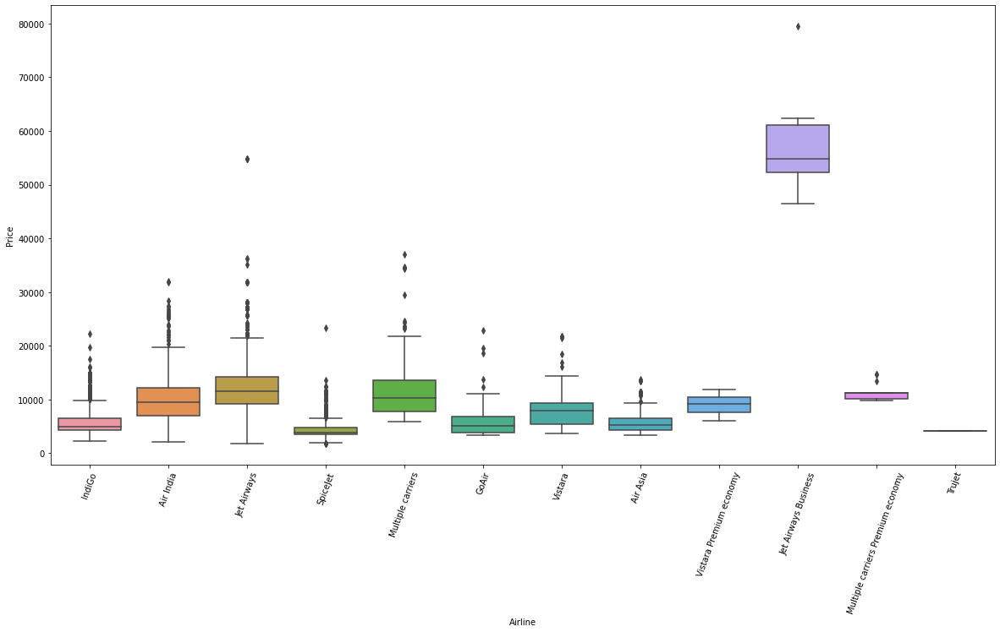

In [69]:
# airline vs price

print(df['Airline'].value_counts())
plt.figure(figsize=(20,10))
plt.xticks(rotation=70)
sns.boxplot(x='Airline', y='Price', data=df)

tells flights and their prices

Delhi       4537
Kolkata     2871
Banglore    2197
Mumbai       697
Chennai      381
Name: Source, dtype: int64


<AxesSubplot:xlabel='Destination', ylabel='Price'>

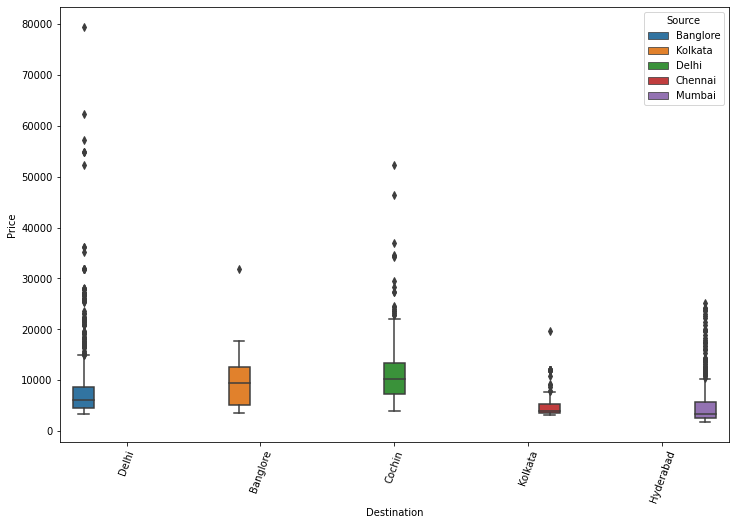

In [70]:
# source vs price

print(df['Source'].value_counts())

plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
sns.boxplot(x='Destination',y='Price',hue='Source',data=df)

displays price for source to destination

Delhi       4537
Kolkata     2871
Banglore    2197
Mumbai       697
Chennai      381
Name: Source, dtype: int64


<AxesSubplot:xlabel='Destination', ylabel='count'>

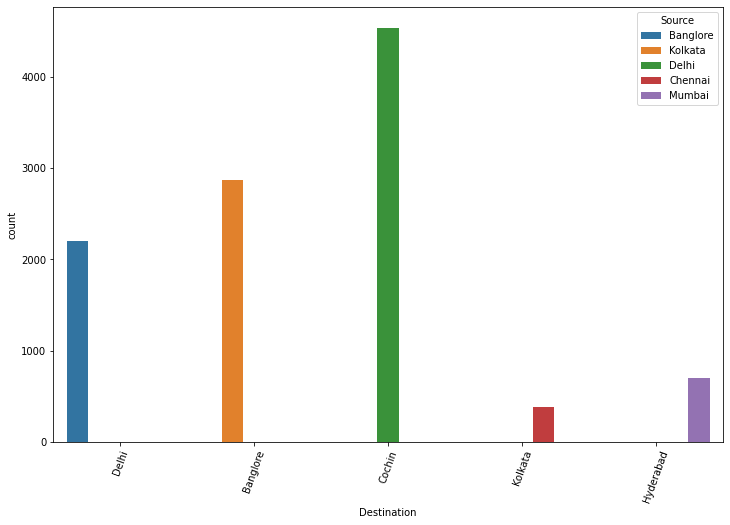

In [71]:
# source vs price

print(df['Source'].value_counts())

plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
sns.countplot(x='Destination',hue='Source',data=df)

displays source to destination and its counts

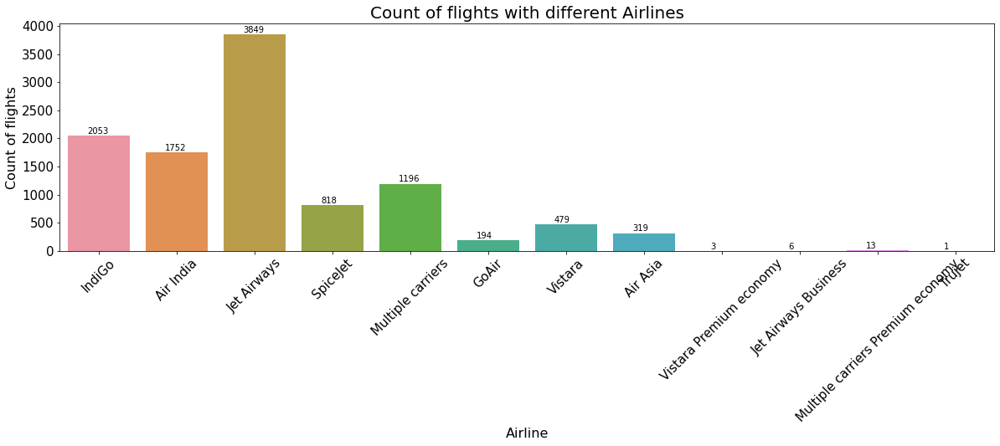

In [72]:
# Count of flights with different airlines

plt.figure(figsize = (20,5))
ax = sns.countplot(x = 'Airline', data = df);
plt.title('Count of flights with different Airlines', fontsize= 20);
plt.xlabel('Airline', fontsize= 16);
plt.ylabel('Count of flights', fontsize= 16);
plt.xticks(rotation = 45, fontsize= 15);
plt.yticks(fontsize= 15);
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x()+0.25, p.get_height()+1), va='bottom', color= 'black')
plt.show();

jetairways goes mostly and least going is multiple carriers flight

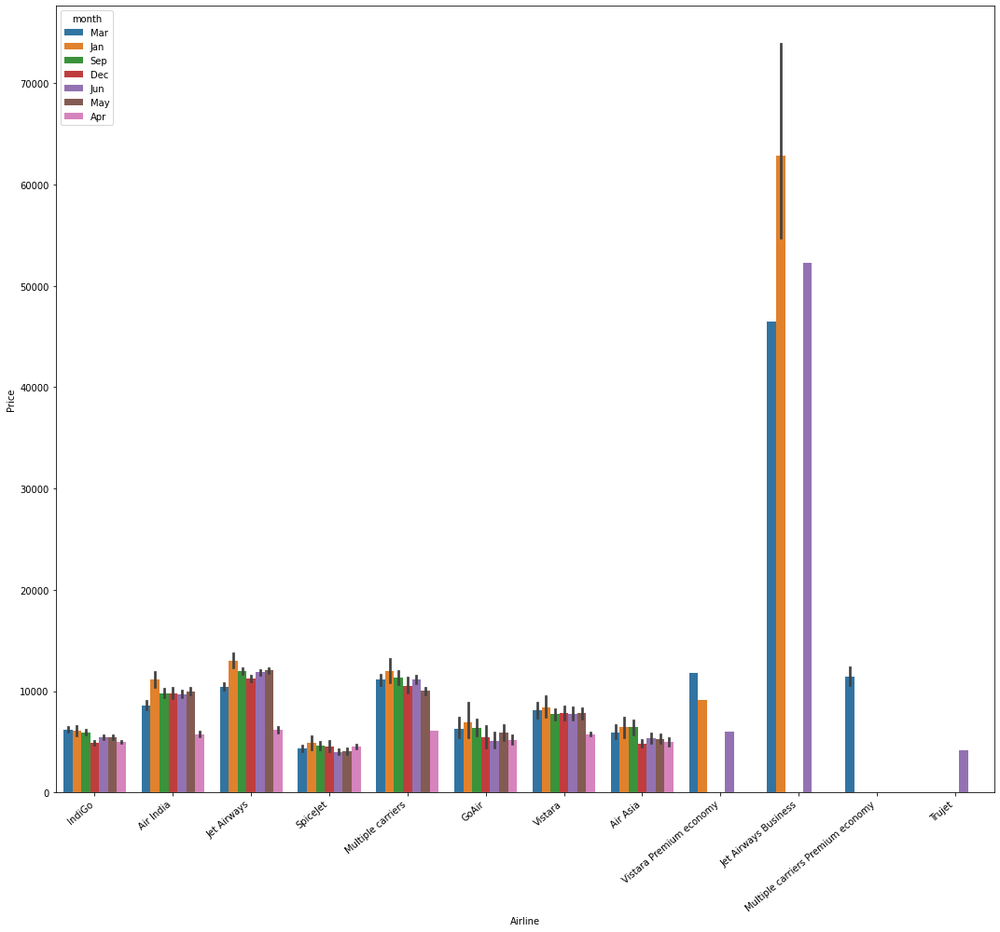

In [73]:
plt.figure(figsize=(15,14))
#now lets check the day of the journey relation with the output price column
ax=sns.barplot(x='Airline',y='Price',hue='month',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

displays count of flights in different months

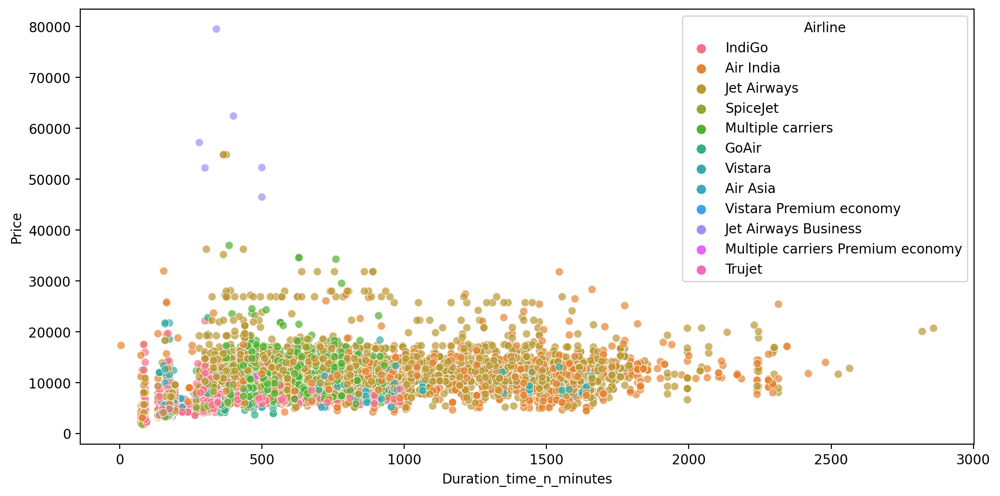

In [74]:
plt.figure(figsize=(12,6),dpi=200)
sns.scatterplot(x='Duration_time_n_minutes',y='Price',data=df,hue='Airline',alpha=0.7,legend='brief');

displays flights and its duration and its prices

In [75]:
px.histogram(df, 
             x='day', 
             color='Source',
             title='Source vs.journey_day')

displays flights starts at source in which days

<AxesSubplot:xlabel='day', ylabel='Price'>

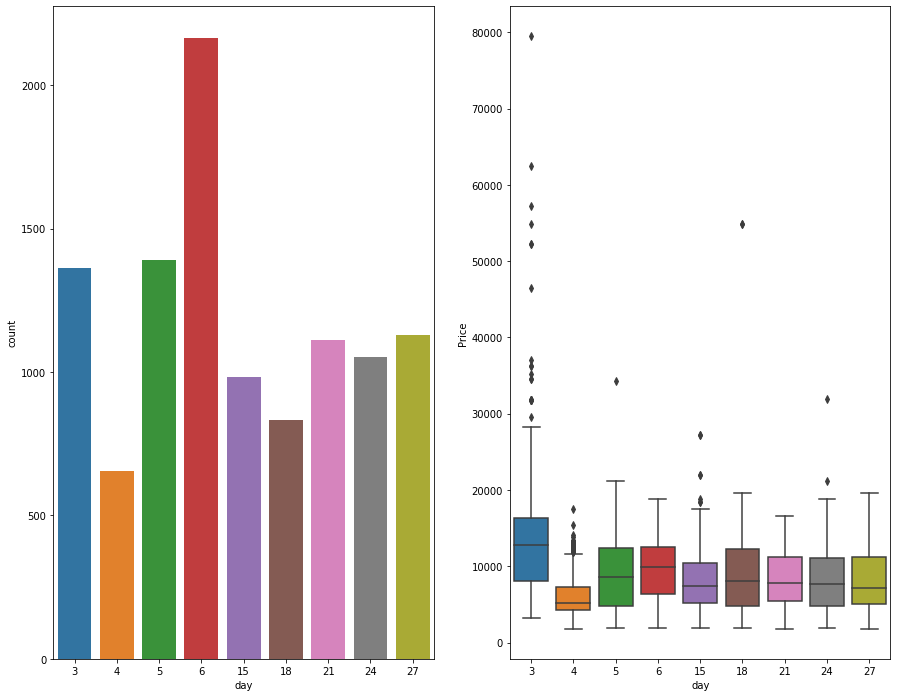

In [76]:
f, axes = plt.subplots(1, 2,figsize=(15,12))
sns.countplot(x = 'day', data = df,ax =axes[0]);
sns.boxplot(df['day'],df['Price'], ax =axes[1])

displays flights at different days and its counts and prices

<AxesSubplot:xlabel='month', ylabel='Price'>

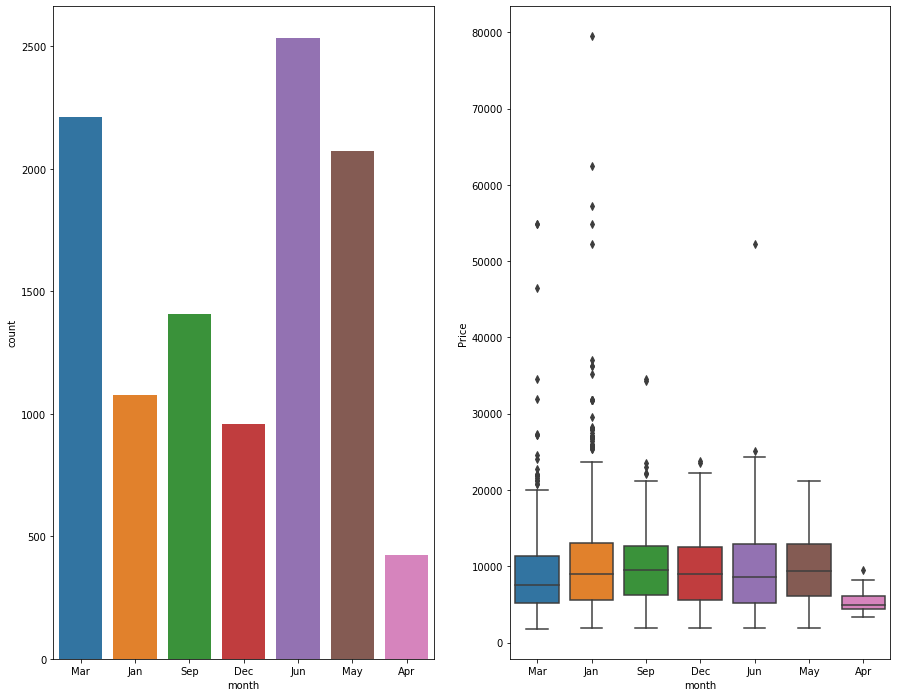

In [77]:
f, axes = plt.subplots(1, 2,figsize=(15,12))
sns.countplot(x = 'month', data = df,ax =axes[0]);
sns.boxplot(df['month'],df['Price'], ax =axes[1])

displays flights at different months and its counts and prices

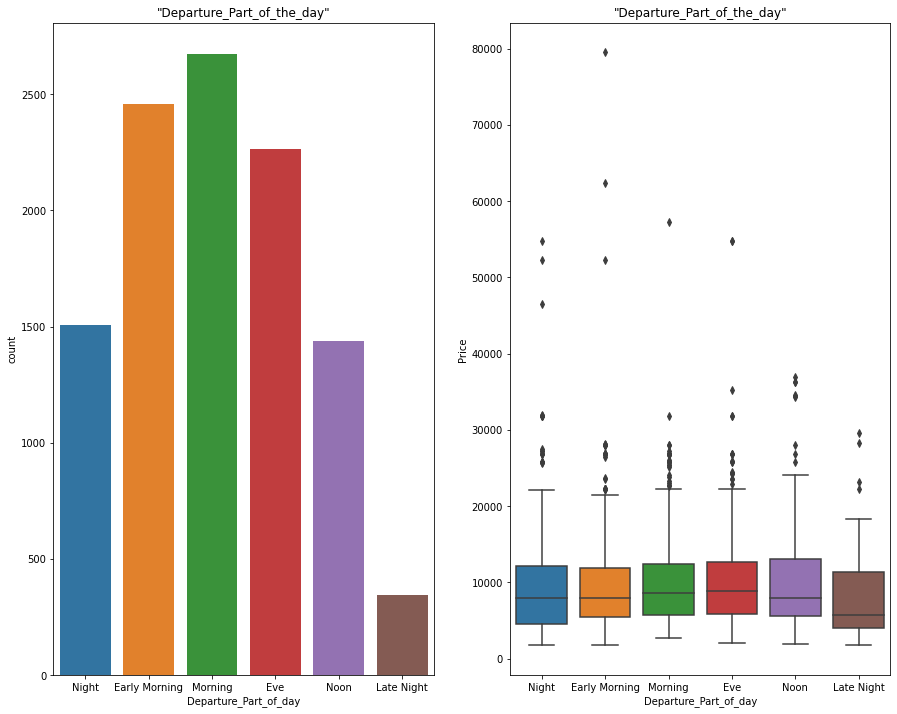

In [78]:
f, axes = plt.subplots(1, 2,figsize=(15,12))
ax=sns.countplot(x = 'Departure_Part_of_day', data = df,ax =axes[0]);
ax.set_title('"Departure_Part_of_the_day"');
ax=sns.boxplot(df['Departure_Part_of_day'],df['Price'], ax =axes[1])
ax.set_title('"Departure_Part_of_the_day"');
            


displays flights at different Departure_Part_of_the_day and its counts and prices

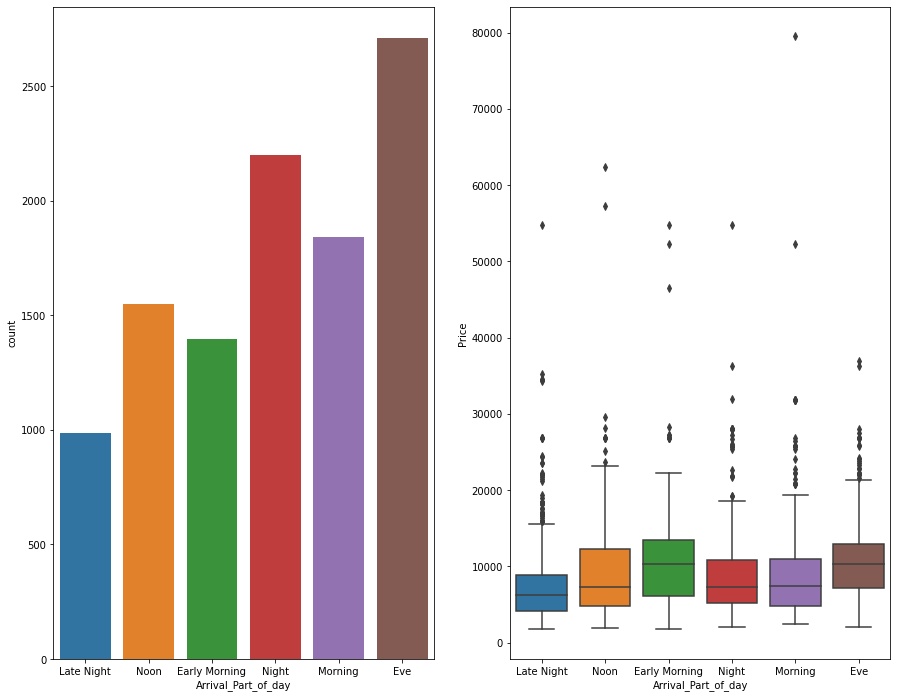

In [79]:
f, axes = plt.subplots(1, 2,figsize=(15,12))
sns.countplot(x = 'Arrival_Part_of_day', data = df,ax =axes[0]);
ax.set_title('Arrival_Part_of_the_day');
sns.boxplot(df['Arrival_Part_of_day'],df['Price'], ax =axes[1])
ax.set_title('Arrival_Part_of_the_day');

displays flights at different Arrival_Part_of_the_day and its counts and prices

<AxesSubplot:xlabel='dayOfWeek', ylabel='Price'>

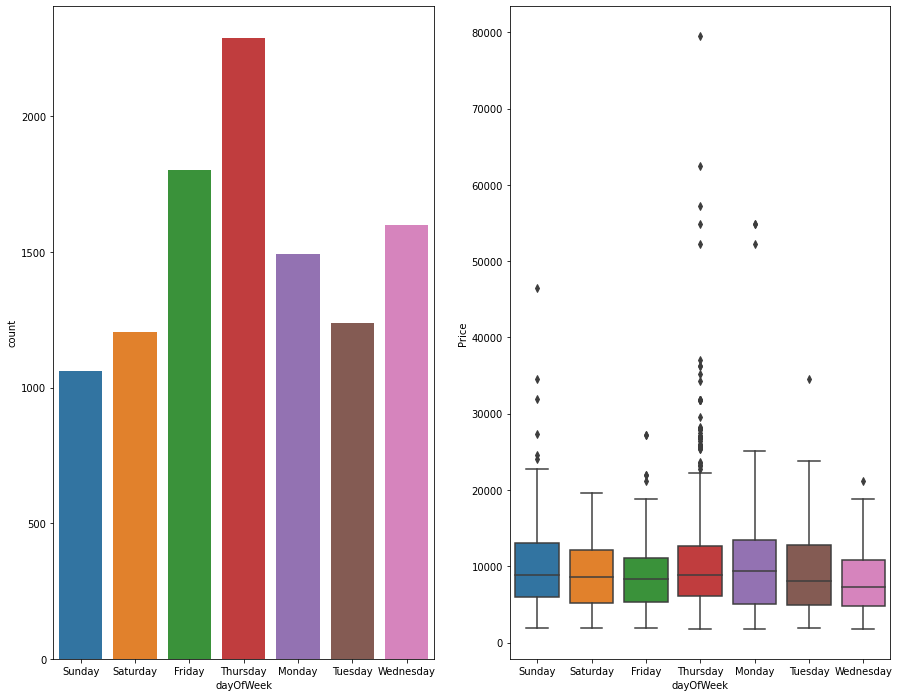

In [80]:
f, axes = plt.subplots(1, 2,figsize=(15,12))
sns.countplot(x = 'dayOfWeek', data = df,ax =axes[0]);
sns.boxplot(df['dayOfWeek'],df['Price'], ax =axes[1])


displays flights at different days_of_the_week and its counts and prices

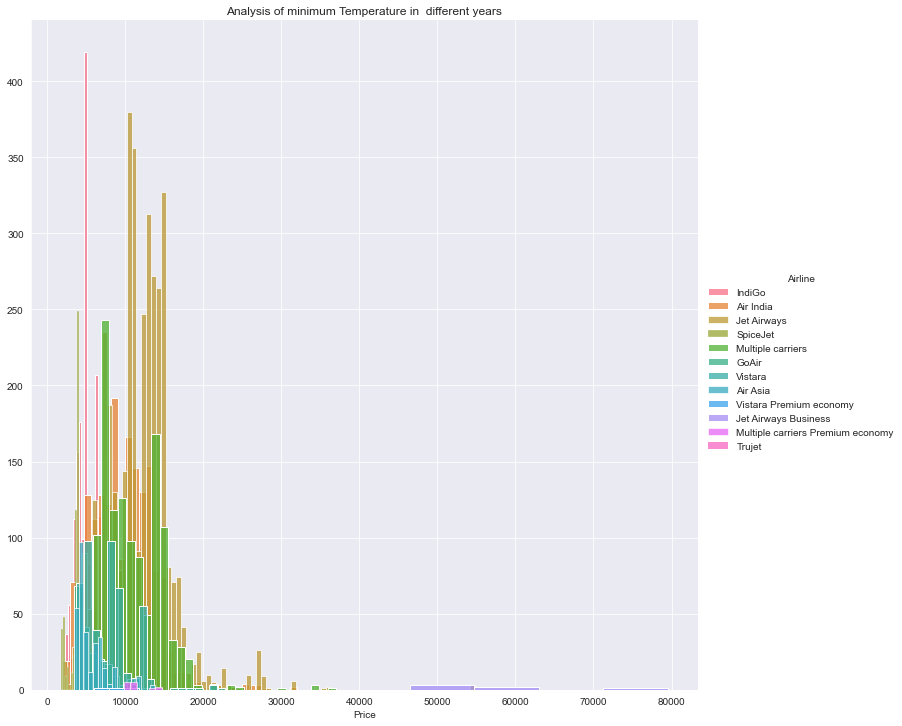

In [81]:
# For Apparent Temperature (C)
sns.set_style("darkgrid")
sns.FacetGrid(df, hue="Airline", height=10).map(sns.histplot, "Price").add_legend()
plt.title("Analysis of minimum Temperature in  different years")
# save the figure
plt.savefig('plot4.png', dpi=300, bbox_inches='tight')
plt.show()


jetairways goes mostly and its price is high

In [82]:
df.drop(['Date_of_Journey','Departure_Part_of_day', 'Arrival_Part_of_day','dayOfWeek','month'], axis = 1, inplace = True)

drop the columns which created only for analysis purpose

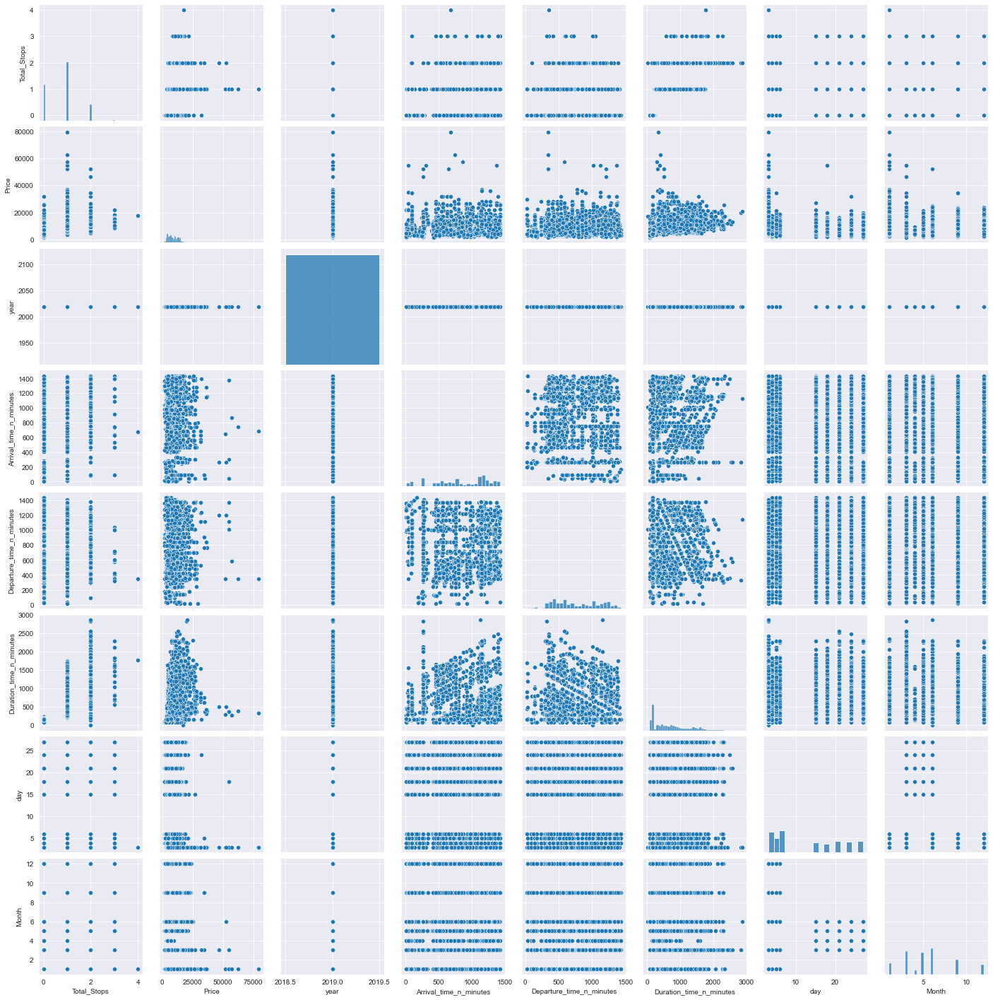

In [83]:
sns.pairplot(df, palette='husl')
sns.despine()

displays if arrival time increases then duration increases and shows price details with month and all other deatils

# DATA PREPROCESSING AND FEATURE ENGINEERING

In [84]:
df.dtypes

Airline                     object
Source                      object
Destination                 object
Total_Stops                  int64
Price                        int64
year                         int64
Arrival_time_n_minutes       int64
Departure_time_n_minutes     int64
Duration_time_n_minutes      int64
day                          int64
Month                        int64
Route1                      object
Route2                      object
Route3                      object
Route4                      object
Route5                      object
dtype: object

## Using  Label Encoder to convert Object data type to int data type

In [85]:
#converting string data type to int type using LabelEncoding
le=LabelEncoder()

list1=['Airline', 'Source', 'Destination','Route1', 'Route2', 'Route3','Route4', 'Route5']
for val in list1:
    df[val]=le.fit_transform(df[val].astype(str))
df

,Airline,Source,Destination,Total_Stops,Price,year,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5
0,3,0,2,0,3897,2019,70,1340,170,24,3,0,13,29,13,5
1,1,3,0,2,7662,2019,795,350,445,5,1,2,25,1,3,5
2,4,2,1,2,13882,2019,265,565,1140,6,9,3,32,4,5,5
3,3,3,0,1,6218,2019,1410,1085,325,5,12,2,34,3,13,5
4,3,0,2,1,13302,2019,1295,1010,285,3,1,0,34,8,13,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,0,3,0,0,4107,2019,1345,1195,150,4,9,2,5,29,13,5
10679,1,3,0,0,4145,2019,1400,1245,155,27,4,2,5,29,13,5
10680,4,0,2,0,7229,2019,680,500,180,27,4,0,13,29,13,5
10681,10,0,2,0,12648,2019,850,690,160,3,1,0,13,29,13,5


In [86]:
#find correlation co.efficient of all variables in table
df.corr()

,Airline,Source,Destination,Total_Stops,Price,year,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5
Airline,1.000000,-0.013401,0.070547,-0.199411,-0.039520,NaN,-0.010399,-0.038456,-0.159803,0.031218,-0.007918,0.035209,-0.061335,0.060414,0.261808,0.056832
Source,-0.013401,1.000000,-0.434227,0.192840,0.015998,NaN,0.026620,0.055935,0.161874,0.007560,0.063052,0.437882,0.035844,-0.271200,-0.076015,-0.008329
Destination,0.070547,-0.434227,1.000000,-0.417410,-0.262157,NaN,-0.058160,-0.082493,-0.380300,0.006373,-0.068903,-0.271101,0.126910,0.558100,0.140139,0.019809
Total_Stops,-0.199411,0.192840,-0.417410,1.000000,0.603883,NaN,0.034018,-0.061623,0.738025,-0.024156,0.065498,0.428924,0.162241,-0.800259,-0.729373,-0.207430
Price,-0.039520,0.015998,-0.262157,0.603883,1.000000,NaN,0.020921,0.005485,0.506371,-0.165412,0.010700,0.182135,-0.087218,-0.591270,-0.316937,-0.055643
year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Arrival_time_n_minutes,-0.010399,0.026620,-0.058160,0.034018,0.020921,NaN,1.000000,0.010298,0.048905,-0.002999,-0.005401,0.008956,-0.010400,-0.075744,0.047906,-0.026362
Departure_time_n_minutes,-0.038456,0.055935,-0.082493,-0.061623,0.005485,NaN,0.010298,1.000000,0.000971,-0.003150,0.028293,-0.048473,-0.121179,0.017683,0.045137,0.047300
Duration_time_n_minutes,-0.159803,0.161874,-0.380300,0.738025,0.506371,NaN,0.048905,0.000971,1.000000,-0.038480,0.055152,0.289837,0.036331,-0.654882,-0.481876,-0.114402
day,0.031218,0.007560,0.006373,-0.024156,-0.165412,NaN,-0.002999,-0.003150,-0.038480,1.000000,-0.264899,0.092231,-0.019223,0.034478,-0.013921,0.009287


year column has none correlation so we can drop that column.and here there is no zero correlation too with target

<AxesSubplot:>

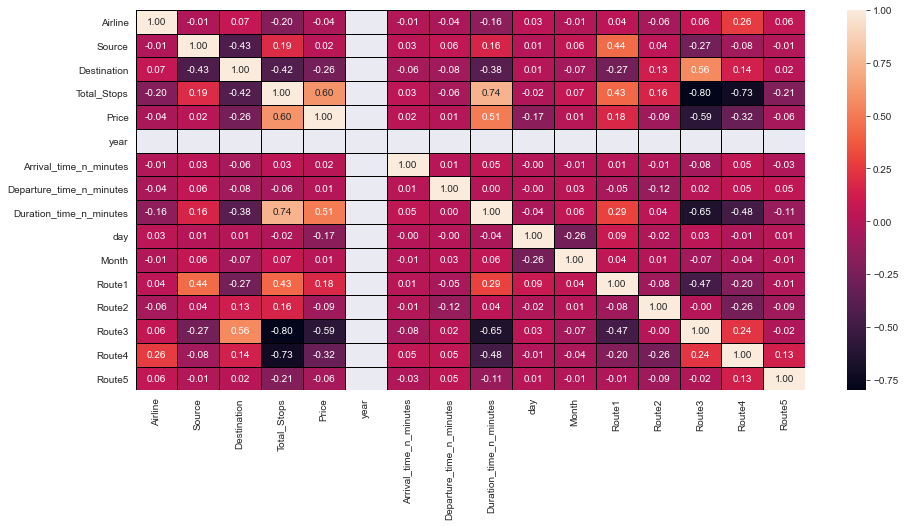

In [87]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True,linewidths=0.5,linecolor="black",fmt='.2f')

mostly highly positively correlated column is total stops and duration and most highly negatively correlated column is Route 3.source and arrival,departure and month has same correlation with the target column.so check vif

In [88]:
df.drop(['year'], axis = 1, inplace = True)

In [89]:
df.describe()

,Airline,Source,Destination,Total_Stops,Price,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5
count,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.00000,10683.000000,10683.000000,10683.000000,10683.000000
mean,3.965927,1.952261,1.174389,0.824207,9087.064121,825.617336,773.852382,643.093232,12.682205,5.534775,2.01947,11.897501,13.231489,11.792193,4.983057
std,2.352155,1.177221,1.012934,0.675199,4611.359167,409.324620,344.964055,507.862001,8.803701,2.987489,1.20622,8.006192,11.302319,2.948009,0.263901
min,0.000000,0.000000,0.000000,0.000000,1759.000000,5.000000,20.000000,5.000000,3.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,2.000000,0.000000,0.000000,5277.000000,525.000000,480.000000,170.000000,5.000000,3.000000,1.00000,7.000000,4.000000,13.000000,5.000000
50%,4.000000,2.000000,1.000000,1.000000,8372.000000,845.000000,710.000000,520.000000,6.000000,5.000000,2.00000,8.000000,6.000000,13.000000,5.000000
75%,4.000000,3.000000,2.000000,1.000000,12373.000000,1155.000000,1085.000000,930.000000,21.000000,6.000000,3.00000,14.000000,29.000000,13.000000,5.000000
max,11.000000,4.000000,4.000000,4.000000,79512.000000,1435.000000,1435.000000,2860.000000,27.000000,12.000000,4.00000,44.000000,29.000000,13.000000,5.000000


skewness present in Price,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes all these coulmns since max diff between 75% and max.all other columns are Ok

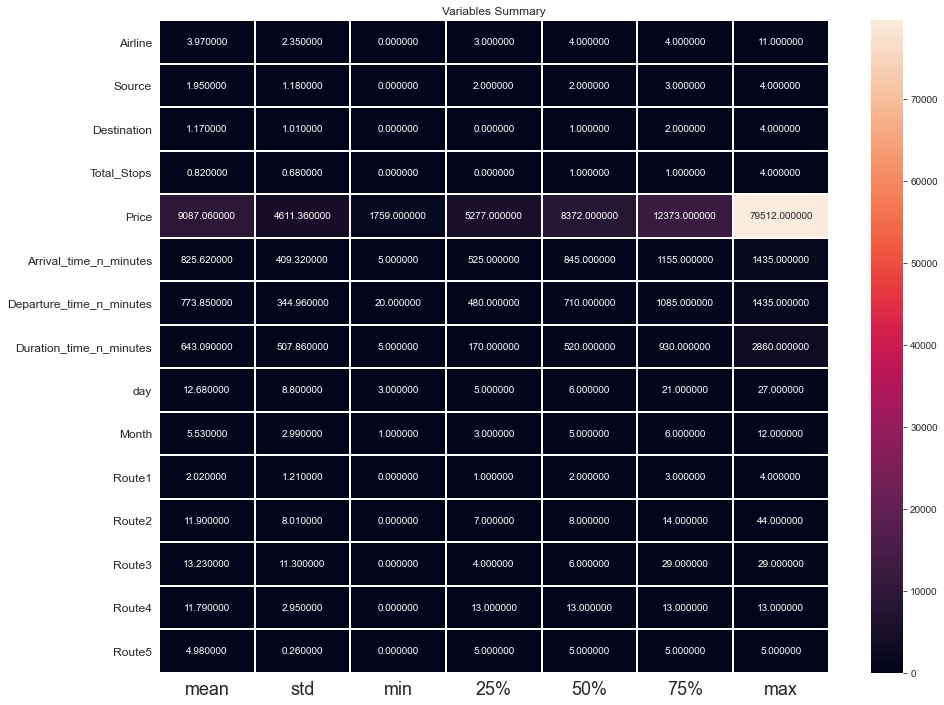

In [90]:
plt.figure(figsize=(15,12))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=12)
plt.title("Variables Summary")
plt.show()

### Visualization using Correlation

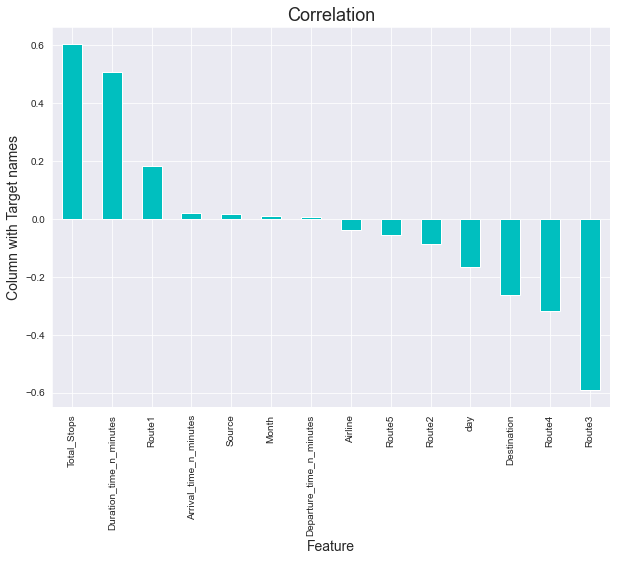

In [91]:
plt.figure(figsize=(10,7))
df.corr()['Price'].sort_values(ascending=False).drop(['Price']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column with Target names',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

displays most correlated and less correlated variable with target as we seen in heatmap

In [92]:
df.shape

(10683, 15)

In [93]:
v=df[list(df.columns)[4]] 
df=df.drop(['Price'],axis=1) 
df

,Airline,Source,Destination,Total_Stops,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5
0,3,0,2,0,70,1340,170,24,3,0,13,29,13,5
1,1,3,0,2,795,350,445,5,1,2,25,1,3,5
2,4,2,1,2,265,565,1140,6,9,3,32,4,5,5
3,3,3,0,1,1410,1085,325,5,12,2,34,3,13,5
4,3,0,2,1,1295,1010,285,3,1,0,34,8,13,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,0,3,0,0,1345,1195,150,4,9,2,5,29,13,5
10679,1,3,0,0,1400,1245,155,27,4,2,5,29,13,5
10680,4,0,2,0,680,500,180,27,4,0,13,29,13,5
10681,10,0,2,0,850,690,160,3,1,0,13,29,13,5


In [94]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [95]:
df.shape[1]

14

## Check Variation Inflation Factor

In [96]:
#calculates vif
def calc_vif(df):
    vif=pd.DataFrame()
    vif['Variables']=df.columns
    vif['VIF FACTOR']=[variance_inflation_factor(df.values,i)for i in range(df.shape[1])]
    return(vif)


calc_vif(df)

,Variables,VIF FACTOR
0,Airline,4.201812
1,Source,5.643706
2,Destination,4.224835
3,Total_Stops,19.244817
4,Arrival_time_n_minutes,5.144822
5,Departure_time_n_minutes,6.229800
6,Duration_time_n_minutes,6.010172
7,day,3.365554
8,Month,4.794759
9,Route1,6.305142


In [97]:
df.shape

(10683, 14)

In [98]:
df.insert(14,'Price',v) 
df

,Airline,Source,Destination,Total_Stops,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5,Price
0,3,0,2,0,70,1340,170,24,3,0,13,29,13,5,3897
1,1,3,0,2,795,350,445,5,1,2,25,1,3,5,7662
2,4,2,1,2,265,565,1140,6,9,3,32,4,5,5,13882
3,3,3,0,1,1410,1085,325,5,12,2,34,3,13,5,6218
4,3,0,2,1,1295,1010,285,3,1,0,34,8,13,5,13302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,0,3,0,0,1345,1195,150,4,9,2,5,29,13,5,4107
10679,1,3,0,0,1400,1245,155,27,4,2,5,29,13,5,4145
10680,4,0,2,0,680,500,180,27,4,0,13,29,13,5,7229
10681,10,0,2,0,850,690,160,3,1,0,13,29,13,5,12648


In [99]:
df.shape[1]

15

## Checking Outliers and Skewness

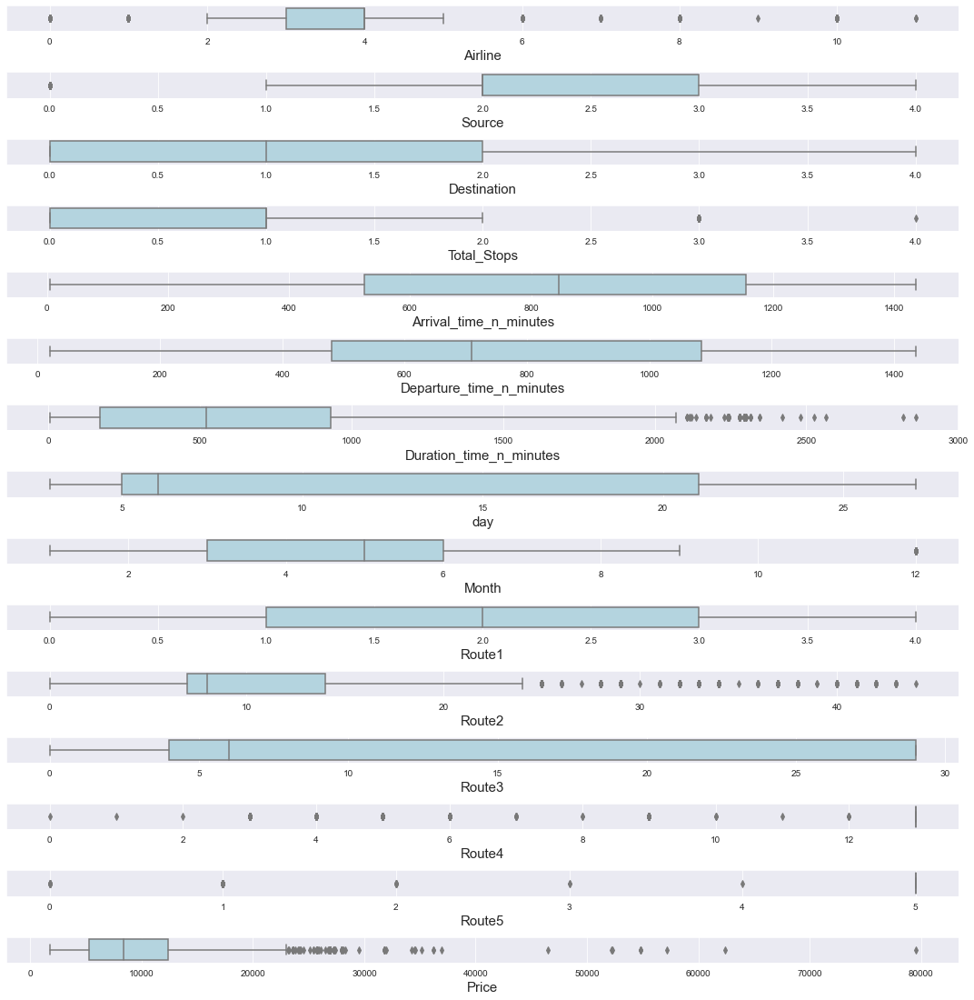

In [100]:
plt.figure(figsize= (15,20))
pltnum = 1
for i in df:
    if pltnum <=20:
        plt.subplot(20,1,pltnum)
        sns.boxplot(df[i],color = 'lightblue')
        plt.xlabel(i,fontsize=15)
    pltnum+=1
plt.tight_layout()

most outliers are present in departure route 1 and route 3

In [101]:
#ckeck skewness
df.skew()

Airline                      0.731095
Source                      -0.424054
Destination                  0.846715
Total_Stops                  0.317049
Arrival_time_n_minutes      -0.371280
Departure_time_n_minutes     0.125184
Duration_time_n_minutes      0.861074
day                          0.367373
Month                        0.629540
Route1                      -0.618662
Route2                       1.424628
Route3                       0.621716
Route4                      -2.082590
Route5                     -16.012886
Price                        1.812552
dtype: float64

Since target column is only integer column and it has slight skewness and we no need to remove that

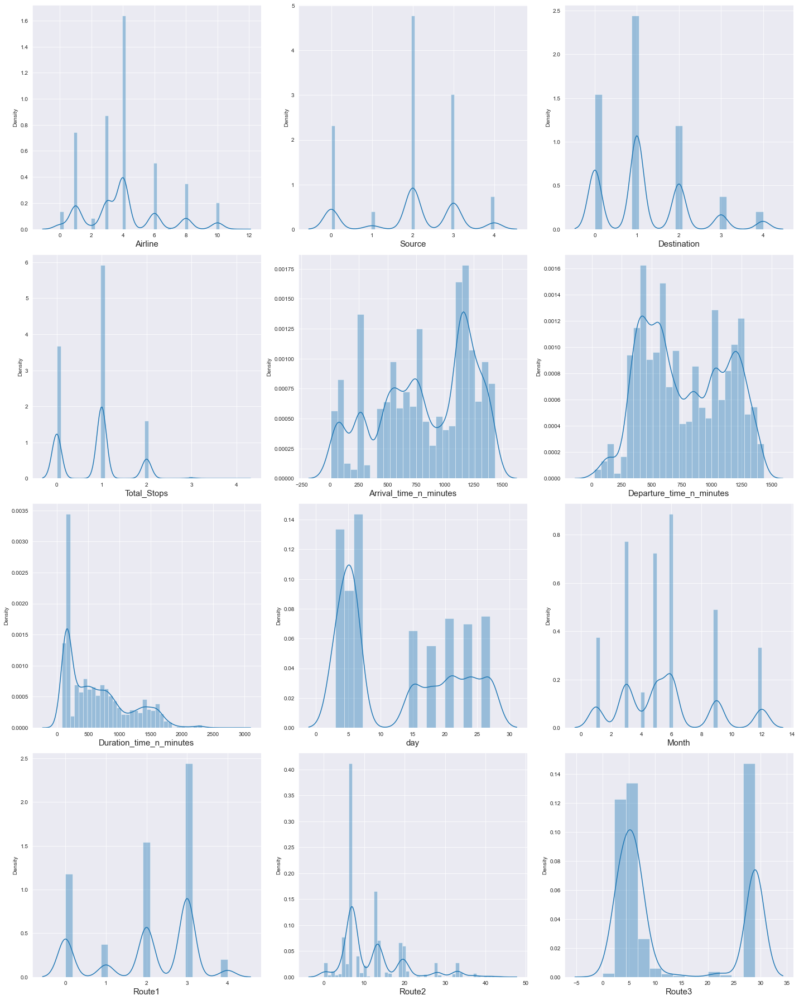

In [102]:
plt.figure(figsize = (20, 25))
plotnumber = 1

for col in df:
    if plotnumber <= 12:
        ax = plt.subplot(4, 3, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)
        
    plotnumber += 1
    
plt.tight_layout()
plt.show()

## Using Z-score to remove outliers

In [103]:

import numpy as np
from scipy.stats import zscore
z=np.abs(zscore(df))
z.shape


(10683, 15)

In [104]:
threshold=3
print(np.where(z>3))

(array([   16,   123,   164,   185,   191,   226,   249,   291,   365,
         396,   402,   402,   402,   458,   470,   482,   486,   510,
         553,   596,   597,   628,   657,   673,   720,   785,   826,
         853,   877,   919,   919,   936,   946,   959,   961,   966,
         969,   972,   975,  1010,  1014,  1067,  1113,  1138,  1196,
        1203,  1211,  1218,  1218,  1218,  1246,  1327,  1339,  1341,
        1346,  1386,  1424,  1442,  1462,  1466,  1478,  1496,  1551,
        1558,  1591,  1596,  1628,  1629,  1654,  1657,  1665,  1665,
        1785,  1791,  1798,  1804,  1918,  1949,  1966,  2055,  2099,
        2108,  2151,  2172,  2172,  2172,  2172,  2185,  2205,  2360,
        2495,  2497,  2533,  2543,  2553,  2556,  2618,  2623,  2623,
        2633,  2633,  2635,  2641,  2654,  2670,  2693,  2697,  2718,
        2718,  2718,  2718,  2814,  2814,  2822,  2822,  2924,  3032,
        3082,  3104,  3111,  3157,  3157,  3183,  3220,  3220,  3234,
        3257,  3304

In [105]:
df_new=df[(z<3).all(axis=1)]
print(df.shape)
print(df_new.shape)

(10683, 15)
(10348, 15)


some outliers got removed

In [106]:
#finds data loss
loss_percent=(10683-10348)/(10683*100)
print(loss_percent)

0.0003135823270616868


data loss percentage is very low.data is cleaned also

In [107]:
df_new


,Airline,Source,Destination,Total_Stops,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5,Price
0,3,0,2,0,70,1340,170,24,3,0,13,29,13,5,3897
1,1,3,0,2,795,350,445,5,1,2,25,1,3,5,7662
2,4,2,1,2,265,565,1140,6,9,3,32,4,5,5,13882
3,3,3,0,1,1410,1085,325,5,12,2,34,3,13,5,6218
4,3,0,2,1,1295,1010,285,3,1,0,34,8,13,5,13302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,0,3,0,0,1345,1195,150,4,9,2,5,29,13,5,4107
10679,1,3,0,0,1400,1245,155,27,4,2,5,29,13,5,4145
10680,4,0,2,0,680,500,180,27,4,0,13,29,13,5,7229
10681,10,0,2,0,850,690,160,3,1,0,13,29,13,5,12648


In [108]:
df_new.shape

(10348, 15)

## Skewness Removal and Scaling

In [109]:
#removing skewness using power transform
from sklearn.preprocessing import power_transform
df_new=power_transform(df_new,method='yeo-johnson',standardize=False)
df_new

array([[1.93776428e+00, 0.00000000e+00, 1.15043011e+00, ...,
        1.50709885e+08, 1.48340233e+03, 5.69589184e+01],
       [8.16071035e-01, 3.72380954e+00, 0.00000000e+00, ...,
        7.40198677e+03, 1.48340233e+03, 7.42189716e+01],
       [2.38168246e+00, 2.35777290e+00, 7.13540718e-01, ...,
        1.83621196e+05, 1.48340233e+03, 9.34764997e+01],
       ...,
       [2.38168246e+00, 0.00000000e+00, 1.15043011e+00, ...,
        1.50709885e+08, 1.48340233e+03, 7.25552008e+01],
       [4.36997840e+00, 0.00000000e+00, 1.15043011e+00, ...,
        1.50709885e+08, 1.48340233e+03, 9.01684846e+01],
       [8.16071035e-01, 2.35777290e+00, 7.13540718e-01, ...,
        1.83621196e+05, 1.48340233e+03, 8.76410660e+01]])

In [110]:
df_for_model = pd.DataFrame(df_new) 

## Seggregate Data

In [111]:
#seggregate input data and output data
x=df_for_model.iloc[:,:-1]
y=df_for_model.iloc[:,-1]

### Scaling

In [112]:
#scaling to get better model performance
from sklearn.preprocessing import MinMaxScaler
mmscaler = MinMaxScaler()
x= mmscaler.fit_transform(x)
x

array([[0.41791194, 0.        , 0.66797513, ..., 1.        , 1.        ,
        0.        ],
       [0.17599965, 0.71907522, 0.        , ..., 0.28031985, 0.        ,
        0.        ],
       [0.51365047, 0.45529076, 0.4143037 , ..., 0.58170273, 0.00116932,
        0.        ],
       ...,
       [0.51365047, 0.        , 0.66797513, ..., 1.        , 1.        ,
        0.        ],
       [0.94246042, 0.        , 0.66797513, ..., 1.        , 1.        ,
        0.        ],
       [0.17599965, 0.45529076, 0.4143037 , ..., 0.58170273, 0.00116932,
        0.        ]])

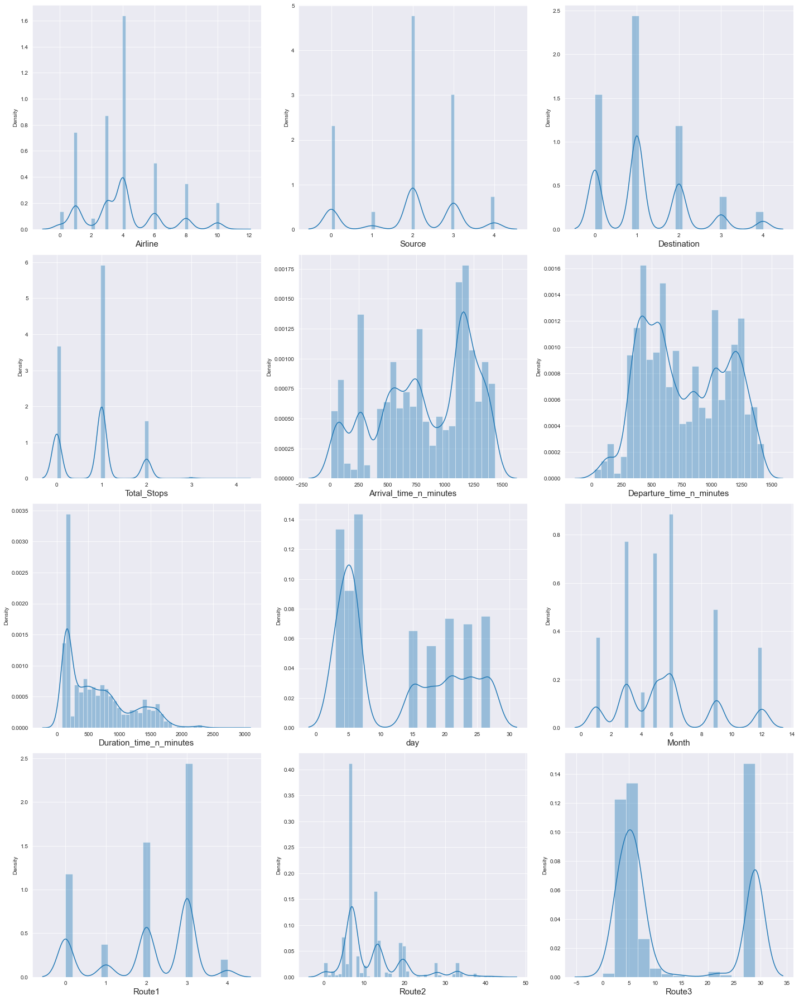

In [218]:
plt.figure(figsize = (20, 25))
plotnumber = 1

for col in df:
    if plotnumber <= 12:
        ax = plt.subplot(4, 3, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)
        
    plotnumber += 1
    
plt.tight_layout()
plt.show()

# MAKE TEST DATA READY

## Do same procedure as we did for Training data

In [115]:
#stroing into csv file

test_x= pd.read_excel(r"C:\Users\Srividya\Downloads\Flight_Ticket_Participant_Datasets-20190305T100527Z-001 (4)\Flight_Ticket_Participant_Datasets\Test_set.xlsx")
test_y= pd.read_excel(r"C:\Users\Srividya\Downloads\Flight_Ticket_Participant_Datasets-20190305T100527Z-001 (4)\Flight_Ticket_Participant_Datasets\Sample_submission.xlsx")


In [116]:
pd.set_option('display.max_columns', None)

In [117]:
test_x

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
...,...,...,...,...,...,...,...,...,...,...
2666,Air India,6/06/2019,Kolkata,Banglore,CCU → DEL → BLR,20:30,20:25 07 Jun,23h 55m,1 stop,No info
2667,IndiGo,27/03/2019,Kolkata,Banglore,CCU → BLR,14:20,16:55,2h 35m,non-stop,No info
2668,Jet Airways,6/03/2019,Delhi,Cochin,DEL → BOM → COK,21:50,04:25 07 Mar,6h 35m,1 stop,No info
2669,Air India,6/03/2019,Delhi,Cochin,DEL → BOM → COK,04:00,19:15,15h 15m,1 stop,No info


In [118]:
test_x.drop('Additional_Info',inplace=True,axis=1)

In [119]:
# replace empty values of the columns by mean,most frequent values
import numpy as np
from sklearn.impute import SimpleImputer
for col in ['Total_Stops','Route']:
    imp=SimpleImputer(missing_values=np.NaN,strategy="most_frequent")
    test_x[col]=imp.fit_transform(test_x[col].values.reshape(-1,1))

In [120]:
#As we can see that there are two 'Delhi' values in column we combine them
test_x['Destination']=test_x['Destination'].str.replace('New Delhi','Delhi')

In [121]:
import calendar
  
test_x['year'] = pd.DatetimeIndex(test_x['Date_of_Journey']).year

In [122]:
test_x['Arrival_Time']=test_x['Arrival_Time'].str.split(' ').str[0]

In [123]:
arrival_time=test_x['Arrival_Time']
test_x['Arrival_hour']=pd.to_datetime(arrival_time).dt.hour
test_x['Arrival_minute']=pd.to_datetime(arrival_time).dt.minute

In [124]:
test_x.drop('Arrival_Time',axis=1,inplace=True)

In [125]:
Depart_time=test_x['Dep_Time']
test_x['Departure_hour']=pd.to_datetime(Depart_time).dt.hour
test_x['Departure_minute']=pd.to_datetime(Depart_time).dt.minute

In [126]:
test_x.drop('Dep_Time',axis=1,inplace=True)

In [127]:
# Time taken by plane to reach destination is called Duration
# It is the differnce betwwen Departure Time and Arrival time
# Assigning and converting Duration column into list
duration = list(test_x["Duration"])

for i in range(len(duration)):
    if len(duration[i].split()) != 2:    # Check if duration contains only hour or mins
        if "h" in duration[i]:
            duration[i] = duration[i].strip() + " 0m"   # Adds 0 minute
        else:
            duration[i] = "0h " + duration[i]           # Adds 0 hour

duration_hours = []
duration_mins = []
for i in range(len(duration)):
    duration_hours.append(int(duration[i].split(sep = "h")[0]))    # Extract hours from duration
    duration_mins.append(int(duration[i].split(sep = "m")[0].split()[-1]))   # Extracts only minutes from duration

In [128]:
# Adding duration_hours and duration_mins list to train_data dataframe
test_x["Duration_hours"] = duration_hours
test_x["Duration_mins"] = duration_mins

In [129]:
test_x.drop(["Duration"], axis = 1, inplace = True)

In [130]:
test_x['Arrival_hour'] = test_x['Arrival_hour'] * 60

In [131]:
test_x['Arrival_time_n_minutes']=test_x['Arrival_hour']+test_x['Arrival_minute']

In [132]:
test_x.drop(['Arrival_hour','Arrival_minute'], axis = 1, inplace = True)

In [133]:
test_x['Departure_hour'] = test_x['Departure_hour'] * 60

In [134]:
test_x['Departure_time_n_minutes']=test_x['Departure_hour']+test_x['Departure_minute']

In [135]:
test_x.drop(['Departure_hour','Departure_minute'], axis = 1, inplace = True)

In [136]:
test_x['Duration_hours'] = test_x['Duration_hours'] * 60

In [137]:
test_x['Duration_time_n_minutes']=test_x['Duration_hours']+test_x['Duration_mins']

In [138]:
test_x.drop(['Duration_hours','Duration_mins'], axis = 1, inplace = True)

In [139]:
# separate journey day and month from journey_date
test_x['day'] = pd.to_datetime(test_x.Date_of_Journey, format='%d/%m/%Y').dt.day
test_x['Month'] = pd.to_datetime(test_x.Date_of_Journey, format='%d/%m/%Y').dt.month

In [140]:
# replace the values of total steps
test_x.replace({"non-stop": 0, "1 stop": 1, "2 stops": 2, "3 stops": 3, "4 stops": 4}, inplace = True)

In [141]:
test_x['Route1']=test_x['Route'].str.split('→').str[0]
test_x['Route2']=test_x['Route'].str.split('→').str[1]
test_x['Route3']=test_x['Route'].str.split('→').str[2]
test_x['Route4']=test_x['Route'].str.split('→').str[3]
test_x['Route5']=test_x['Route'].str.split('→').str[4]

In [142]:
test_x.drop(["Route"], axis = 1, inplace = True)

In [143]:
for i in ['Route3', 'Route4', 'Route5']:
    test_x[i].fillna('None',inplace=True)

In [144]:
test_x.drop(['Date_of_Journey'], axis = 1, inplace = True)

In [145]:
#converting string data type to int type using LabelEncoding
le=LabelEncoder()

list1=['Airline', 'Source', 'Destination','Route1', 'Route2', 'Route3','Route4', 'Route5']
for val in list1:
    test_x[val]=le.fit_transform(test_x[val].astype(str))
test_x

,Airline,Source,Destination,Total_Stops,year,Arrival_time_n_minutes,Departure_time_n_minutes,Duration_time_n_minutes,day,Month,Route1,Route2,Route3,Route4,Route5
0,4,2,1,1,2019,265,1050,655,6,6,3,7,5,9,4
1,3,3,0,1,2019,620,380,240,12,5,2,29,3,9,4
2,4,2,1,1,2019,1140,1155,1425,21,5,3,7,5,9,4
3,6,2,1,1,2019,1260,480,780,21,5,3,7,5,9,4
4,0,0,2,0,2019,165,1435,170,24,6,0,13,27,9,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2666,1,3,0,1,2019,1225,1230,1435,6,6,2,14,3,9,4
2667,3,3,0,0,2019,1015,860,155,27,3,2,5,27,9,4
2668,4,2,1,1,2019,265,1310,395,6,3,3,7,5,9,4
2669,1,2,1,1,2019,1155,240,915,6,3,3,7,5,9,4


In [146]:
test_x.drop(['year'], axis = 1, inplace = True)

In [147]:
test_y

,Price
0,15998
1,16612
2,25572
3,25778
4,16934
...,...
2666,14046
2667,14086
2668,22720
2669,23544


In [148]:
df2 = pd.concat([test_x, test_y], axis=1, join='inner')

In [149]:
df2.shape

(2671, 15)

In [150]:
import numpy as np
from scipy.stats import zscore
z=np.abs(zscore(df2))
z.shape

(2671, 15)

In [151]:
threshold=3
print(np.where(z>3))

(array([   6,   50,   72,   72,   77,   99,  113,  120,  136,  177,  196,
        211,  230,  246,  251,  251,  251,  251,  260,  271,  281,  297,
        312,  312,  338,  339,  341,  344,  344,  367,  424,  461,  463,
        474,  484,  484,  491,  505,  510,  554,  563,  579,  635,  642,
        655,  664,  666,  673,  673,  673,  679,  680,  700,  724,  725,
        725,  725,  735,  748,  750,  786,  819,  822,  830,  833,  862,
        870,  875,  875,  877,  877,  888,  966,  974,  987,  999, 1022,
       1085, 1088, 1101, 1108, 1110, 1130, 1175, 1185, 1246, 1251, 1262,
       1271, 1279, 1312, 1328, 1335, 1379, 1381, 1400, 1437, 1457, 1479,
       1483, 1490, 1501, 1508, 1511, 1536, 1554, 1555, 1622, 1682, 1686,
       1689, 1689, 1689, 1689, 1744, 1756, 1756, 1781, 1805, 1825, 1838,
       1861, 1876, 1888, 1889, 1891, 1918, 1921, 1923, 1943, 1945, 1957,
       1973, 1975, 1985, 1987, 1988, 2001, 2002, 2021, 2021, 2026, 2077,
       2090, 2114, 2226, 2231, 2251, 2293, 2308, 2

In [152]:
df_new1=df2[(z<3).all(axis=1)]
print(df2.shape)
print(df_new1.shape)

(2671, 15)
(2516, 15)


some outliers got removed

In [153]:
#finds data loss
loss_percent=(2671-2516)/(2671*100)
print(loss_percent)

0.0005803070011231749


data loss is very less 

In [154]:
#removing skewness using power transform
from sklearn.preprocessing import power_transform
df_new1=power_transform(df_new1,method='yeo-johnson',standardize=False)
df_new1

array([[2.71178963e+00, 2.24416554e+00, 7.39088958e-01, ...,
        1.69219404e+07, 5.63327446e+01, 4.20111879e+01],
       [2.16294145e+00, 3.48951556e+00, 0.00000000e+00, ...,
        1.69219404e+07, 5.63327446e+01, 4.24523661e+01],
       [2.71178963e+00, 2.24416554e+00, 7.39088958e-01, ...,
        1.69219404e+07, 5.63327446e+01, 4.78180895e+01],
       ...,
       [2.71178963e+00, 2.24416554e+00, 7.39088958e-01, ...,
        1.69219404e+07, 5.63327446e+01, 4.62882749e+01],
       [8.59642268e-01, 2.24416554e+00, 7.39088958e-01, ...,
        1.69219404e+07, 5.63327446e+01, 4.67443339e+01],
       [3.69169858e+00, 2.24416554e+00, 7.39088958e-01, ...,
        1.69219404e+07, 5.63327446e+01, 4.87761288e+01]])

In [155]:
df_for_model1 = pd.DataFrame(df_new1) 

In [156]:
#seggregate input data and output data
test_input=df_for_model1.iloc[:,:-1]
test_target=df_for_model1.iloc[:,-1]

In [158]:
#scaling to get better model performance
from sklearn.preprocessing import MinMaxScaler
mmscaler = MinMaxScaler()
test_input= mmscaler.fit_transform(test_input)
test_input

array([[0.50576117, 0.46838433, 0.39483217, ..., 0.71691518, 1.        ,
        0.        ],
       [0.40339848, 0.72830385, 0.        , ..., 0.60231907, 1.        ,
        0.        ],
       [0.50576117, 0.46838433, 0.39483217, ..., 0.71691518, 1.        ,
        0.        ],
       ...,
       [0.50576117, 0.46838433, 0.39483217, ..., 0.71691518, 1.        ,
        0.        ],
       [0.16032722, 0.46838433, 0.39483217, ..., 0.71691518, 1.        ,
        0.        ],
       [0.68851867, 0.46838433, 0.39483217, ..., 0.71691518, 1.        ,
        0.        ]])

# MODEL EVALUATION

## REGRESSION :

## Linear Regression

In [159]:
#Linear Regression
#model fitting
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split



In [160]:
#getting best accuracy with help of selecting random state
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At random state {i},the training accuracy is:{r2_score(y_train,pred_train)*100}")
    print(f"At random state {i},the testing accuracy is:{r2_score(y_test,pred_test)*100}")
    print("\n")
    
    
    
    

At random state 0,the training accuracy is:61.17643941643684
At random state 0,the testing accuracy is:60.48147685163181


At random state 1,the training accuracy is:60.50057638321875
At random state 1,the testing accuracy is:63.105367757428446


At random state 2,the training accuracy is:61.477181055570554
At random state 2,the testing accuracy is:59.23454876476968


At random state 3,the training accuracy is:61.28083889463668
At random state 3,the testing accuracy is:60.05490872213095


At random state 4,the training accuracy is:60.9741298671605
At random state 4,the testing accuracy is:61.22985213574316


At random state 5,the training accuracy is:60.58477874209463
At random state 5,the testing accuracy is:62.783587133511375


At random state 6,the training accuracy is:61.251986195001386
At random state 6,the testing accuracy is:60.03559014747984


At random state 7,the training accuracy is:61.02855330851742
At random state 7,the testing accuracy is:60.93249569856323


At random sta

In [161]:
#evaluation metrics

print("Accuracy:", r2_score(y_test,pred_test)*100)

Accuracy: 61.3096142328886


## CV Score

In [162]:
#cross validation at random state
Train_accuracy=(r2_score(y_train,pred_train)*100)
Test_accuracy=r2_score(y_test,pred_test)*100
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,x_test,y_test,cv=j)
    cv_mean=cv_score.mean()*100
    print(f"At cross fold {j} the cv score is {cv_mean} and accuracy score for Training is {Train_accuracy} and accuracy score for Testing is {Test_accuracy}")
    print("\n")
    

At cross fold 2 the cv score is 60.04509841545167 and accuracy score for Training is 60.9679589803935 and accuracy score for Testing is 61.3096142328886


At cross fold 3 the cv score is 60.82895630420847 and accuracy score for Training is 60.9679589803935 and accuracy score for Testing is 61.3096142328886


At cross fold 4 the cv score is 60.748938599990545 and accuracy score for Training is 60.9679589803935 and accuracy score for Testing is 61.3096142328886


At cross fold 5 the cv score is 60.954135627619756 and accuracy score for Training is 60.9679589803935 and accuracy score for Testing is 61.3096142328886


At cross fold 6 the cv score is 60.84807063897355 and accuracy score for Training is 60.9679589803935 and accuracy score for Testing is 61.3096142328886


At cross fold 7 the cv score is 60.85469131058653 and accuracy score for Training is 60.9679589803935 and accuracy score for Testing is 61.3096142328886


At cross fold 8 the cv score is 60.81753089271593 and accuracy score

# Hyper parameter Tuning

In [163]:
#perform gridsearchcv and cross val score on LinearRegression
from sklearn.model_selection import GridSearchCV

parameters={'fit_intercept':[True,False], 'normalize':[True,False], 'n_jobs':[None,1,-1]}
lr=LinearRegression()
clf=GridSearchCV(lr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'fit_intercept': True, 'n_jobs': None, 'normalize': True}


In [164]:
lr=LinearRegression( fit_intercept= True, n_jobs= None, normalize= True)
lr.fit(x_train,y_train)
pred_test_lr=lr.predict(x_test)
pred_train_lr=lr.predict(x_train)
lr_score = lr.score(x_train,y_train)
lr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",lr_acc_score*100)
print("score of model is:",lr_score*100)

Accuracy score is: 61.3096142328886
score of model is: 60.9679589803935


## CV Score

In [165]:
cv_score_lr=cross_val_score(lr,x_test,y_test,cv=5)
cv_mean_lr=cv_score_lr.mean()
print("cv_mean is:",cv_mean_lr*100)

cv_mean is: 60.954135627619756


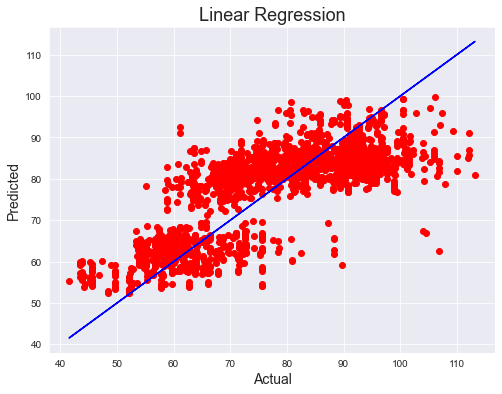

In [166]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

In [167]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test))
print("mean squared error",mean_squared_error(y_test,pred_test))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test)))
print("r2_score is",r2_score(y_test,pred_test)*100)

mean absolute error 7.301935884865543
mean squared error 81.9350802413371
Root mean squared error 9.05179983436096
r2_score is 61.3096142328886


# LASSO REGRESSION

## parameter tuning

In [168]:
#perform gridsearchcv and cross val score on lasso regression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import Lasso
parameters={'alpha':[0.0001,0.001,0.01,0.1,1,10],'random_state':list(range(0,10)),'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001]}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'alpha': 0.0001, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [169]:
ls=Lasso(alpha=0.0001,random_state=0,fit_intercept= True, normalize= False,tol= 0.001)
ls.fit(x_train,y_train)
pred_test_ls=ls.predict(x_test)
pred_train_ls=ls.predict(x_train)
ls_score = ls.score(x_train,y_train)
ls_acc_score=r2_score(y_test,pred_test_ls)
print("Accuracy score is:",ls_acc_score*100)


Accuracy score is: 61.309708015678765


In [170]:
#checks cv score
for u in range(2,10):
    cv_score_ls=cross_val_score(ls,x,y,cv=5)
    cv_mean_ls=cv_score_ls.mean()
    print("At cv :-",j )
    print("cv_score is:",cv_mean_ls*100)
    print("accuracy score---r2_score is",ls_acc_score*100)

At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765
At cv :- 9
cv_score is: 60.867645949607606
accuracy score---r2_score is 61.309708015678765


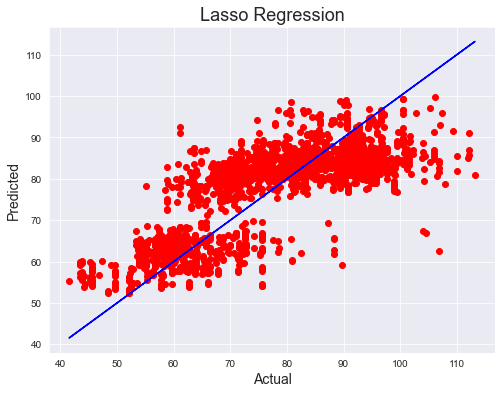

In [171]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_ls,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Lasso Regression',fontsize=18)
plt.show()

In [172]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_ls))
print("mean squared error",mean_squared_error(y_test,pred_test_ls))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_ls)))
print("r2_score is",r2_score(y_test,pred_test_ls)*100)

mean absolute error 7.3019025131600435
mean squared error 81.93488163643086
Root mean squared error 9.051788863889328
r2_score is 61.309708015678765


# RANDOM FOREST REGRESSION

## parameter tuning

In [175]:
#perform gridsearchcv and cross val score on RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
parameters={'criterion':['mse','mae'],'max_features':["auto","sqrt"],'bootstrap': [True, False],'min_samples_split':[1,2],'min_samples_leaf':[1,2]}
rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

                                                      


{'bootstrap': True, 'criterion': 'mse', 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2}


In [176]:
rf=RandomForestRegressor(criterion="mse",max_features="auto",bootstrap= True,min_samples_leaf= 2, min_samples_split= 2)
rf.fit(x_train,y_train)
pred_test_rf=rf.predict(x_test)
pred_train_rf=rf.predict(x_train)
rf_score = rf.score(x_train,y_train)
rf_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",rf_acc_score*100)
print("score of model is:",rf_score*100)

Accuracy score is: 61.3096142328886
score of model is: 94.25651352806287


In [177]:
cv_score_rf=cross_val_score(rf,x,y,cv=5)
cv_mean_rf=cv_score_rf.mean()
print("cv_mean is:",cv_mean_rf*100)

cv_mean is: 86.72429554494968


In [178]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_rf))
print("mean squared error",mean_squared_error(y_test,pred_test_rf))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_rf)))
print("r2_score is",r2_score(y_test,pred_test_rf)*100)

mean absolute error 3.4550737695704345
mean squared error 26.52950956504631
Root mean squared error 5.150680495337127
r2_score is 87.47255807572803


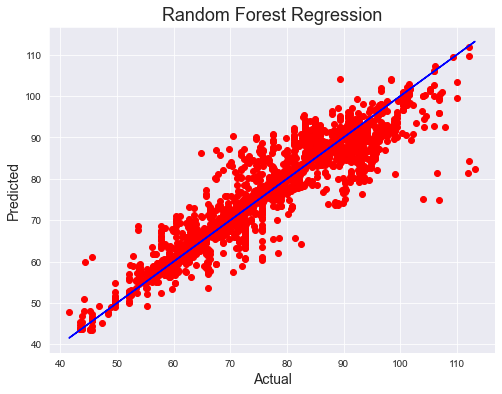

In [179]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_rf,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Random Forest Regression',fontsize=18)
plt.show()

# RIDGE REGRESSION

In [180]:
#perform gridsearchcv and cross val score on Ridge Regressor
from sklearn.linear_model import Ridge
parameters={'alpha':[0.0001,0.001,0.01,0.1,1],'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001],'random_state':list(range(0,10))}
rd=Ridge()
clf=GridSearchCV(rd,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'alpha': 1, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [181]:
rd=Ridge(alpha=1,fit_intercept=True,normalize=False,random_state=0,tol=0.001)
rd.fit(x_train,y_train)
pred_test_rd=rd.predict(x_test)
pred_train_rd=rd.predict(x_train)
rd_score = rd.score(x_train,y_train)
rd_acc_score=r2_score(y_test,pred_test_rd)
print("Accuracy score is:",rd_acc_score*100)
print("score of model is:",rd_score*100)

Accuracy score is: 61.313173320613444
score of model is: 60.967753893763856


In [182]:
cv_score_rd=cross_val_score(rd,x,y,cv=5)
cv_mean_rd=cv_score_rd.mean()
print("cv_mean is:",cv_mean_rd*100)

cv_mean is: 60.8681713464333


In [183]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_rd))
print("mean squared error",mean_squared_error(y_test,pred_test_rd))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_rd)))
print("r2_score is",r2_score(y_test,pred_test_rd)*100)

mean absolute error 7.302425013416384
mean squared error 81.92754311983934
Root mean squared error 9.05138349203255
r2_score is 61.313173320613444


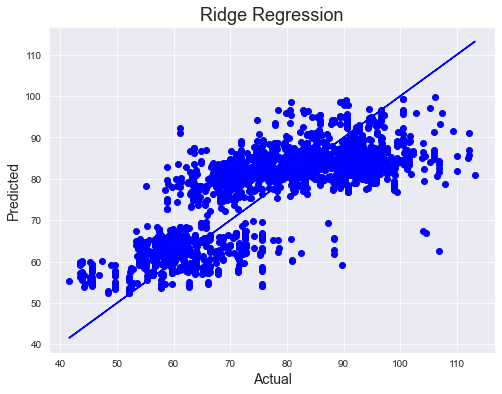

In [184]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_rd,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Ridge Regression',fontsize=18)
plt.show()

# DECISION TREE REGRESSOR

In [185]:
#perform gridsearchcv and cross val score on Decison Tree Regressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
parameters={'criterion':['mse','friedman_mse','mae','poisson'],'splitter':['best','random'],'max_features':['auto', 'sqrt', 'log2'],'random_state':list(range(0,10)),'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]}
dt=DecisionTreeRegressor()
clf=GridSearchCV(dt,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

                  

{'criterion': 'mse', 'max_features': 'auto', 'min_weight_fraction_leaf': 0.1, 'random_state': 1, 'splitter': 'best'}


In [186]:
dt=DecisionTreeRegressor(criterion='mse',max_features= 'auto', min_weight_fraction_leaf= 0.1, random_state= 1, splitter= 'best')
dt.fit(x_train,y_train)
pred_test_dt=dt.predict(x_test)
pred_train_dt=dt.predict(x_train)
dt_score = dt.score(x_train,y_train)
dt_acc_score=r2_score(y_test,pred_test_dt)
print("Accuracy score is:",dt_acc_score*100)
print("score of model is:",dt_score*100)


Accuracy score is: 62.85703010570334
score of model is: 62.88457601162655


In [187]:
cv_score_dt=cross_val_score(dt,x,y,cv=5)
cv_mean_dt=cv_score_dt.mean()
print("cv_mean is:",cv_mean_dt*100)

cv_mean is: 62.76212097267583


In [188]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_dt))
print("mean squared error",mean_squared_error(y_test,pred_test_dt))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_dt)))
print("r2_score is",r2_score(y_test,pred_test_dt)*100)

mean absolute error 6.9375411651774925
mean squared error 78.65809963770688
Root mean squared error 8.868940164287212
r2_score is 62.85703010570334


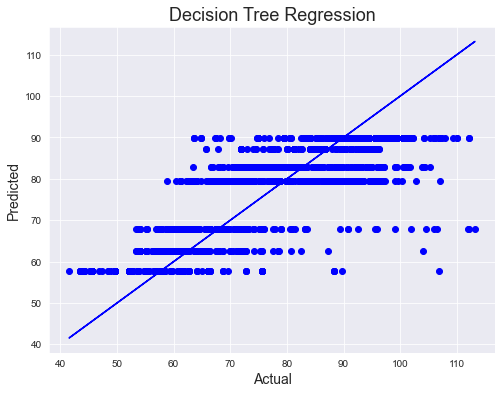

In [189]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_dt,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Decision Tree Regression',fontsize=18)
plt.show()

# GRADIENT BOOSTING REGRESSOR

In [190]:
#perform gridsearchcv and cross val score on  GradientBoostingRegressor
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
parameters={'loss':['ls','lad','squared_error','absolute_error'],'n_estimators':[50,100],'criterion':['friedman_mse','mse'],'learning_rate':[0.05],'max_depth' : [1,3,4],'min_weight_fraction_leaf':[0.1,0.2,0.3]}
gbr=GradientBoostingRegressor()
clf=GridSearchCV(gbr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)



{'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'ls', 'max_depth': 4, 'min_weight_fraction_leaf': 0.1, 'n_estimators': 100}


In [191]:

gbr=GradientBoostingRegressor(criterion='friedman_mse',loss='ls',n_estimators=100,learning_rate= 0.05,max_depth= 4, min_weight_fraction_leaf= 0.1)
gbr.fit(x_train,y_train)
pred_test_gbr=gbr.predict(x_test)
pred_train_gbr=gbr.predict(x_train)
gbr_score = gbr.score(x_train,y_train)
gbr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",gbr_acc_score*100)
print("score of model is:",gbr_score*100)

Accuracy score is: 61.3096142328886
score of model is: 76.50967906472361


In [192]:
cv_score_gbr=cross_val_score(gbr,x,y,cv=5)
cv_mean_gbr=cv_score_gbr.mean()
print("cv_mean is:",cv_mean_gbr*100)

cv_mean is: 76.36726679807951


In [193]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_gbr))
print("mean squared error",mean_squared_error(y_test,pred_test_gbr))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_gbr)))
print("r2_score is",r2_score(y_test,pred_test_gbr)*100)

mean absolute error 5.358181209574962
mean squared error 48.77548439608859
Root mean squared error 6.983944758951677
r2_score is 76.96783475766577


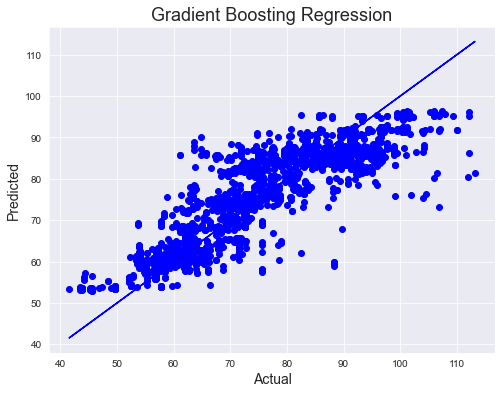

In [194]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_gbr,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Gradient Boosting Regression',fontsize=18)
plt.show()

# SUPPORT VECTOR REGRESSOR

In [195]:
#perform gridsearchcv and cross val score on Support Vector Regressor
from sklearn.svm import SVR
parameters ={'kernel':['linear','rbf'],'gamma':['scale', 'auto'],'tol':[0.01,0.001],'shrinking':[True,False],'degree':[3,4],'max_iter':[1,-1]}
sv=SVR()
clf=GridSearchCV(sv,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': False, 'tol': 0.01}


In [198]:
sv=SVR(kernel='rbf',gamma='scale',degree=3, max_iter= -1, shrinking= False, tol= 0.01)
sv.fit(x_train,y_train)
pred_test_sv=sv.predict(x_test)
pred_train_sv=sv.predict(x_train)
sv_score = sv.score(x_train,y_train)
sv_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",sv_acc_score*100)
print("score of model is:",sv_score*100)

Accuracy score is: 61.3096142328886
score of model is: 69.59794408460496


In [199]:
cv_score_sv=cross_val_score(sv,x,y,cv=5)
cv_mean_sv=cv_score_sv.mean()
print("cv_mean is:",cv_mean_sv*100)

cv_mean is: 69.24724224523354


In [200]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_sv))
print("mean squared error",mean_squared_error(y_test,pred_test_sv))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_sv)))
print("r2_score is",r2_score(y_test,pred_test_sv)*100)

mean absolute error 6.038113540824644
mean squared error 62.53331514763979
Root mean squared error 7.907800904653568
r2_score is 70.47127946622913


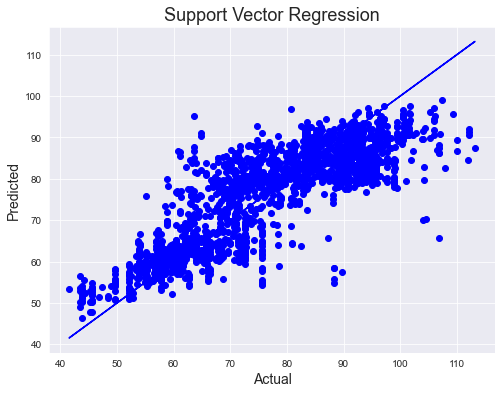

In [201]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_sv,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Support Vector Regression',fontsize=18)
plt.show()

# ELASTIC NET REGRESSION(COMBINATION OF L1 AND L2)

In [202]:
from sklearn.linear_model import ElasticNet
parameters={'alpha':[0.0001,0.001,0.01,0.1,1],'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001],'random_state':list(range(0,10))}
enr=ElasticNet()
clf=GridSearchCV(enr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.0001, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [203]:
enr=ElasticNet(alpha=0.0001,fit_intercept= True,normalize= False, random_state= 0, tol= 0.001)
enr.fit(x_train,y_train)
pred_test_enr=enr.predict(x_test)
pred_train_enr=enr.predict(x_train)
enr_score = enr.score(x_train,y_train)
enr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",enr_acc_score*100)
print("score of model is:",enr_score*100)

Accuracy score is: 61.3096142328886
score of model is: 60.96791878454473


In [204]:
cv_score_enr=cross_val_score(enr,x,y,cv=5)
cv_mean_enr=cv_score_enr.mean()
print("cv_mean is:",cv_mean_enr*100)

cv_mean is: 60.86791057164484


In [205]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_enr))
print("mean squared error",mean_squared_error(y_test,pred_test_enr))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_enr)))
print("r2_score is",r2_score(y_test,pred_test_enr)*100)

mean absolute error 7.302119800069774
mean squared error 81.93173586258526
Root mean squared error 9.051615096908687
r2_score is 61.31119347469417


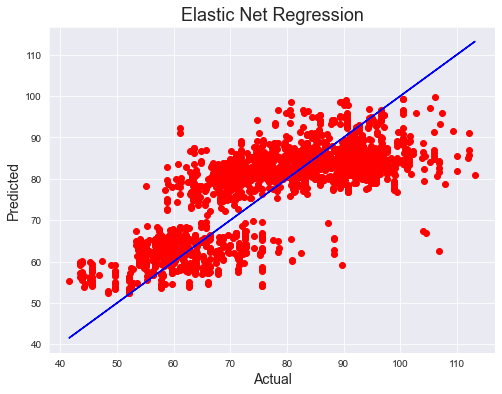

In [206]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_enr,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Elastic Net Regression',fontsize=18)
plt.show()

# CONCLUSION

## OUTPUT
 


In [211]:
import numpy as np
a=np.array(y_test)
predicted=np.array(dt.predict(x_test))
df_con=pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_con


,Original,Predicted
0,78.698195,79.541227
1,52.043713,57.632650
2,83.149001,89.819968
3,57.382160,62.453915
4,100.965661,89.819968
...,...,...
2065,84.499421,79.541227
2066,54.096100,67.981373
2067,71.470029,79.541227
2068,45.654717,57.632650


In [212]:
import pickle
filename='Flight_Price_Prediction_dt.pkl'
pickle.dump(dt,open(filename,'wb'))


In [207]:
models=['Linear Regression','Lasso regression','RandomForestRegressor','Ridge Regressor','Decison Tree Regressor','GradientBoostingRegressor'
,'Support Vector Regressor','ElasticNet Regression']
        


In [208]:
scores=[ lr_acc_score*100,ls_acc_score*100,rf_acc_score*100,rd_acc_score*100,dt_acc_score*100,gbr_acc_score*100,sv_acc_score*100,enr_acc_score*100]
scores

[61.3096142328886,
 61.309708015678765,
 61.3096142328886,
 61.313173320613444,
 62.85703010570334,
 61.3096142328886,
 61.3096142328886,
 61.3096142328886]

In [209]:
Nos=[]
for i in range(1,len(models)+1):
    Nos.append(i)
Nos    

[1, 2, 3, 4, 5, 6, 7, 8]

In [210]:
import pandas as pd
Model_scores=pd.DataFrame({})
Model_scores['Nos']=Nos
Model_scores['Model Names']=models
Model_scores['Scores']=scores
Model_scores.sort_values(by='Scores', ascending=False).style.hide_index()

Nos,Model Names,Scores
5,Decison Tree Regressor,62.857030
4,Ridge Regressor,61.313173
2,Lasso regression,61.309708
1,Linear Regression,61.309614
3,RandomForestRegressor,61.309614
6,GradientBoostingRegressor,61.309614
7,Support Vector Regressor,61.309614
8,ElasticNet Regression,61.309614


## Best Model

From the above models,Decision Tree Classifer performs well,Because Compared to other algorithms decision trees requires less effort for data preparation during pre-processing.A decision tree does not require normalization of data.
A decision tree does not require scaling of data as well.
Missing values in the data also do NOT affect the process of building a decision tree to any considerable extent.
A Decision tree model is very intuitive and easy to explain to technical teams as well as stakeholders.

So we save this model for our Prediction

## Key Insights

The flight ticket prices mainly depends on Route,Duration,Distance and Total stops and other factors

In [213]:
df_con.to_csv("Flight_Price_Prediction_dt.csv",sep='\t')

## MAKE PREDICTION BY USING OUR SEPERATE NEW TEST DATA SET 


Predict the output for new unseen Test data

In [214]:
pred_test_new_raw_data=dt.predict(test_input)
    

Get accuracy score for new unseen Test data 's Prediction

In [216]:
dt_acc_score_unseen_data=r2_score(test_target,pred_test_new_raw_data)

Compare Predicted Result with Unseen Result of new unseen Data

In [217]:
import numpy as np
a=np.array(test_target)
predicted=np.array(dt.predict(test_input))
df_con=pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_con


,Original,Predicted
0,42.011188,89.819968
1,42.452366,67.981373
2,47.818089,89.819968
3,47.923560,82.868317
4,42.678886,67.981373
...,...,...
2511,40.518904,79.541227
2512,40.550992,62.453915
2513,46.288275,89.819968
2514,46.744334,79.541227
